## Import Libraries

In [327]:
#importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Loading Data

In [328]:
X_train = pd.read_csv('X_train_loan_data.csv', index_col = 0)
X_test = pd.read_csv('X_test_loan_data.csv', index_col = 0)
y_train = pd.read_csv('y_train_loan_data.csv', index_col = 0)
y_test = pd.read_csv('y_test_loan_data.csv', index_col = 0)

In [329]:
loan_data_backup = pd.read_csv('loan_data_new_population.csv')

In [330]:
df_loan = loan_data_backup.copy()

### Bird eye view

In [331]:
pd.options.display.max_columns = None
df_loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,68444620,73334399,35000,35000,35000.00,60 months,11.99,778.38,C,C1,Foreign Service Officer,10+ years,MORTGAGE,128000.00,Source Verified,Dec-15,Issued,n,https://www.lendingclub.com/browse/loanDetail....,NaN,home_improvement,Home improvement,200xx,DC,6.46,0.00,Feb-90,0.00,46.00,NaN,17.00,0.00,14277,27.40,46.00,w,35000.00,35000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,0.00,Jan-16,Jan-16,0.00,56.00,1,INDIVIDUAL,NaN,NaN,NaN,0.00,321.00,146867.00,1.00,11.00,0.00,0.00,28.00,35367.00,49.30,0.00,1.00,5020.00,40.10,52200.00,1.00,4.00,0.00
1,68547583,73437441,8650,8650,8650.00,36 months,5.32,260.50,A,A1,Associate Consultant,< 1 year,MORTGAGE,100000.00,Not Verified,Dec-15,Issued,n,https://www.lendingclub.com/browse/loanDetail....,NaN,credit_card,Credit card refinancing,462xx,IN,7.28,0.00,Jul-01,0.00,NaN,NaN,15.00,0.00,7158,26.70,24.00,w,8650.00,8650.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,0.00,Jan-16,Jan-16,0.00,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.00,0.00,165450.00,0.00,1.00,1.00,1.00,11.00,24041.00,88.80,0.00,3.00,3081.00,57.90,26800.00,1.00,0.00,5.00
2,67849662,72708407,4225,4225,4225.00,36 months,14.85,146.16,C,C5,mechanic,5 years,RENT,35000.00,Source Verified,Dec-15,Issued,n,https://www.lendingclub.com/browse/loanDetail....,NaN,debt_consolidation,Debt consolidation,672xx,KS,15.22,2.00,Jul-11,0.00,18.00,NaN,6.00,0.00,1058,24.60,6.00,w,4225.00,4225.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,0.00,Jan-16,Jan-16,0.00,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.00,0.00,4888.00,0.00,1.00,0.00,0.00,47.00,3830.00,21.90,0.00,0.00,367.00,22.40,4300.00,0.00,0.00,0.00
3,68506885,73396712,10000,10000,10000.00,60 months,11.99,222.40,C,C1,CARDIOVASCULAR TECH,10+ years,RENT,42500.00,Not Verified,Dec-15,Issued,n,https://www.lendingclub.com/browse/loanDetail....,NaN,debt_consolidation,Debt consolidation,460xx,IN,31.04,0.00,Dec-98,1.00,NaN,NaN,10.00,0.00,5812,40.90,23.00,w,10000.00,10000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,0.00,Jan-16,Jan-16,0.00,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.00,0.00,41166.00,1.00,3.00,0.00,2.00,13.00,35354.00,75.50,1.00,1.00,3118.00,67.40,14200.00,1.00,1.00,1.00
4,68341763,72928789,20000,20000,20000.00,60 months,10.78,432.66,B,B4,truck driver,10+ years,MORTGAGE,63000.00,Not Verified,Dec-15,Issued,n,https://www.lendingclub.com/browse/loanDetail....,NaN,home_improvement,NaN,605xx,IL,10.78,0.00,Aug-00,0.00,NaN,NaN,6.00,0.00,7869,56.20,18.00,w,20000.00,20000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,0.00,Jan-16,Dec-15,0.00,NaN,1,JOINT,71000.00,13.85,Not Verified,0.00,0.00,189699.00,0.00,1.00,0.00,4.00,19.00,10827.00,72.80,0.00,2.00,2081.00,64.70,14000.00,2.00,5.00,1.00


In [332]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421094 entries, 0 to 421093
Data columns (total 74 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           421094 non-null  int64  
 1   member_id                    421094 non-null  int64  
 2   loan_amnt                    421094 non-null  int64  
 3   funded_amnt                  421094 non-null  int64  
 4   funded_amnt_inv              421094 non-null  float64
 5   term                         421094 non-null  object 
 6   int_rate                     421094 non-null  float64
 7   installment                  421094 non-null  float64
 8   grade                        421094 non-null  object 
 9   sub_grade                    421094 non-null  object 
 10  emp_title                    397220 non-null  object 
 11  emp_length                   397277 non-null  object 
 12  home_ownership               421094 non-null  object 
 13 

## Population Stability Index : Preprocessing

In [333]:
#In data we noticed that employment length is not an integer
df_loan['emp_length'].unique()

array(['10+ years', '< 1 year', '5 years', '3 years', '4 years', nan,
       '2 years', '8 years', '9 years', '1 year', '6 years', '7 years'],
      dtype=object)

In [334]:
df_loan['emp_length_int'] = df_loan['emp_length'].str.replace('+ years','')
df_loan['emp_length_int'] = df_loan['emp_length_int'].str.replace('< 1 year', str(0))
df_loan['emp_length_int'] = df_loan['emp_length_int'].str.replace('n/a', str(0))
df_loan['emp_length_int'] = df_loan['emp_length_int'].str.replace(' years', '')
df_loan['emp_length_int'] = df_loan['emp_length_int'].str.replace('year', '')
df_loan['emp_length_int'].unique()

array(['10', '0', '5', '3', '4', nan, '2', '8', '9', '1 ', '6', '7'],
      dtype=object)

In [335]:
type(df_loan['emp_length_int'][0])

str

In [336]:
#String to numeric for this column
df_loan['emp_length_int'] = pd.to_numeric(df_loan['emp_length_int'])

In [337]:
type(df_loan['emp_length_int'][0])

numpy.float64

In [338]:
#In data we noticed that term is not an integer
df_loan['term'].unique()

array([' 60 months', ' 36 months'], dtype=object)

In [339]:
df_loan['term_int'] = df_loan['term'].str.replace(' months','')

In [340]:
df_loan['term_int'].unique()

array([' 60', ' 36'], dtype=object)

In [341]:
df_loan['term_int'] = pd.to_numeric(df_loan['term_int'])

In [342]:
df_loan['term_int'].unique()

array([60, 36], dtype=int64)

In [343]:
#Earliest credit line are supposed to be date variable
df_loan['earliest_cr_line'].head()

0    Feb-90
1    Jul-01
2    Jul-11
3    Dec-98
4    Aug-00
Name: earliest_cr_line, dtype: object

In [344]:
df_loan['earliest_cr_line_date'] = pd.to_datetime(df_loan['earliest_cr_line'], format = '%b-%y')

In [345]:
df_loan['earliest_cr_line_date'].head()

0   1990-02-01
1   2001-07-01
2   2011-07-01
3   1998-12-01
4   2000-08-01
Name: earliest_cr_line_date, dtype: datetime64[ns]

In [346]:
#We need to calculate difference from today
#Assume we are standing at 01-12-2017
pd.to_datetime('2017-12-01') - df_loan['earliest_cr_line_date']

0         10165 days
1          5997 days
2          2345 days
3          6940 days
4          6331 days
5          5874 days
6          5844 days
7          5236 days
8         11019 days
9          9010 days
10        12845 days
11         7123 days
12         5693 days
13         5570 days
14         5935 days
15         4658 days
16         6239 days
17         3378 days
18         8431 days
19        12267 days
20         5966 days
21         6178 days
22         7001 days
23         4809 days
24         7305 days
25         9680 days
26         7853 days
27         6027 days
28         3044 days
29         9711 days
30         7427 days
31        11688 days
32         5782 days
33        10530 days
34         6392 days
35         5813 days
36         5052 days
37         4109 days
38        10045 days
39         9345 days
40         6119 days
41         5479 days
42         8645 days
43         3987 days
44         7974 days
45         5662 days
46         2253 days
47         30

In [347]:
df_loan['month_since_earliest_cr_line'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - df_loan['earliest_cr_line_date']) / pd.to_timedelta(30.44,'D')))

In [348]:
pd.set_option('display.float_format', '{:.2f}'.format)

In [349]:
df_loan['month_since_earliest_cr_line'].describe()

count   421094.00
mean       227.35
std         98.12
min       -612.00
25%        167.00
50%        212.00
75%        277.00
max        587.00
Name: month_since_earliest_cr_line, dtype: float64

In [350]:
#Negative minimum value is unintuitive
df_loan.loc[:, ['earliest_cr_line','earliest_cr_line_date', 'month_since_earliest_cr_line']][df_loan['month_since_earliest_cr_line']<0]

,earliest_cr_line,earliest_cr_line_date,month_since_earliest_cr_line
254,Jan-57,2057-01-01,-469.00
618,Aug-64,2064-08-01,-560.00
648,Jul-68,2068-07-01,-607.00
1808,Jan-65,2065-01-01,-565.00
2583,Sep-64,2064-09-01,-561.00
3040,May-66,2066-05-01,-581.00
3250,Jul-68,2068-07-01,-607.00
4877,Apr-65,2065-04-01,-568.00
5031,Sep-62,2062-09-01,-537.00
5560,Apr-68,2068-04-01,-604.00


In [351]:
df_loan['month_since_earliest_cr_line'][df_loan['month_since_earliest_cr_line'] < 0] = df_loan['month_since_earliest_cr_line'].max()

In [352]:
df_loan.loc[:, ['earliest_cr_line','earliest_cr_line_date', 'month_since_earliest_cr_line']][df_loan['month_since_earliest_cr_line']<0]

,earliest_cr_line,earliest_cr_line_date,month_since_earliest_cr_line


In [353]:
#All the negative calues are replaced by max value

In [354]:
#Issue date should also be date dtype
df_loan['mths_since_issue_d'] = pd.to_datetime(df_loan['issue_d'],format = '%b-%y')

In [355]:
df_loan['mths_since_issue_d'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - df_loan['mths_since_issue_d']) / pd.to_timedelta(30.44,'D')))

In [356]:
df_loan['mths_since_issue_d'].describe()

count   421094.00
mean        29.04
std          3.46
min         24.00
25%         26.00
50%         29.00
75%         32.00
max         35.00
Name: mths_since_issue_d, dtype: float64

In [357]:
#Create dummy variables for discrete
loan_data_dummies = [pd.get_dummies(df_loan['grade'], prefix = 'grade', prefix_sep = ":"),
                    pd.get_dummies(df_loan['sub_grade'], prefix = 'sub_grade', prefix_sep = ":"),
                    pd.get_dummies(df_loan['home_ownership'], prefix = 'home_ownership', prefix_sep = ":"),
                    pd.get_dummies(df_loan['verification_status'], prefix = 'verification_status', prefix_sep = ":"),
                    pd.get_dummies(df_loan['loan_status'], prefix = 'loan_status', prefix_sep = ":"),
                    pd.get_dummies(df_loan['purpose'], prefix = 'purpose', prefix_sep = ":"),
                    pd.get_dummies(df_loan['addr_state'], prefix = 'addr_state', prefix_sep = ":"),
                    pd.get_dummies(df_loan['initial_list_status'], prefix = 'initial_list_status', prefix_sep = ":")]

In [358]:
loan_data_dummies = pd.concat(loan_data_dummies, axis = 1)

In [359]:
#loan_data_dummies
#Commenting because taking a lot of time to execute

In [360]:
df_loan = pd.concat([df_loan, loan_data_dummies], axis = 1)

In [361]:
df_loan.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'addr_state:TX', 'addr_state:UT', 'addr_state:VA', 'addr_state:VT',
       'addr_state:WA', 'addr_state:WI', 'addr_state:WV', 'addr_state:WY',
       'initial_list_status:f', 'initial_list_status:w'],
      dtype='object', length=201)

### Missing value treatment

In [362]:
pd.options.display.max_rows = None

In [363]:
df_loan.isnull().sum()

id                                          0
member_id                                   0
loan_amnt                                   0
funded_amnt                                 0
funded_amnt_inv                             0
term                                        0
int_rate                                    0
installment                                 0
grade                                       0
sub_grade                                   0
emp_title                               23874
emp_length                              23817
home_ownership                              0
annual_inc                                  0
verification_status                         0
issue_d                                     0
loan_status                                 0
pymnt_plan                                  0
url                                         0
desc                                   421049
purpose                                     0
title                             

In [364]:
df_missing = pd.DataFrame(df_loan.isnull().sum(), columns = ['Missing Values'])

In [365]:
df_missing[df_missing['Missing Values'] > 0]

,Missing Values
emp_title,23874
emp_length,23817
desc,421049
title,132
mths_since_last_delinq,203961
mths_since_last_record,346679
revol_util,162
last_pymnt_d,17283
next_pymnt_d,25757
last_credit_pull_d,11


In [366]:
df_loan['total_rev_hi_lim'].fillna(df_loan['funded_amnt'], inplace = True)

In [367]:
df_loan['total_rev_hi_lim'].isnull().sum()

0

<Axes: xlabel='annual_inc', ylabel='Count'>

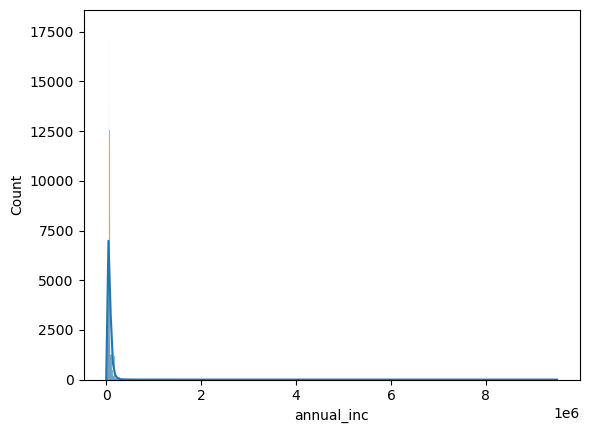

In [368]:
sns.histplot(df_loan['annual_inc'], kde=True)

In [369]:
Q1 = df_loan['annual_inc'].quantile(0.25)
Q3 = df_loan['annual_inc'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = df_loan[(df_loan['annual_inc'] < lower_bound) | (df_loan['annual_inc'] > upper_bound)]

<Axes: xlabel='annual_inc'>

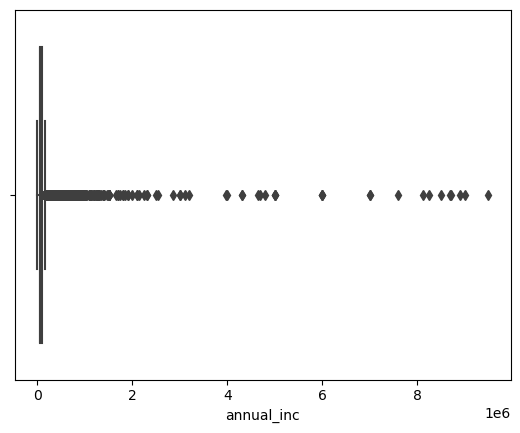

In [370]:
sns.boxplot(x=df_loan['annual_inc'])

In [371]:
#annual income is positively skewed -- replacing by median
df_loan['annual_inc'].fillna(df_loan['annual_inc'].median(), inplace = True)

In [372]:
df_loan['annual_inc'].isnull().sum()

0

In [373]:
#replace null with 0
to_replace_zero = ['month_since_earliest_cr_line','acc_now_delinq','total_acc','pub_rec','open_acc','inq_last_6mths','delinq_2yrs','emp_length_int']

for i in to_replace_zero:
    df_loan[i].fillna(0, inplace = True)

In [374]:
df_loan.isnull().sum()

id                                          0
member_id                                   0
loan_amnt                                   0
funded_amnt                                 0
funded_amnt_inv                             0
term                                        0
int_rate                                    0
installment                                 0
grade                                       0
sub_grade                                   0
emp_title                               23874
emp_length                              23817
home_ownership                              0
annual_inc                                  0
verification_status                         0
issue_d                                     0
loan_status                                 0
pymnt_plan                                  0
url                                         0
desc                                   421049
purpose                                     0
title                             

# PD Model

## Data Preparation

### Dependent variables -- Good/Bad default definition

In [375]:
df_loan['loan_status'].unique()

array(['Issued', 'Current', 'Fully Paid', 'In Grace Period',
       'Late (16-30 days)', 'Late (31-120 days)', 'Charged Off',
       'Default'], dtype=object)

In [376]:
df_loan['loan_status'].value_counts() / df_loan['loan_status'].count()

loan_status
Current              0.90
Fully Paid           0.05
Issued               0.02
Late (31-120 days)   0.01
In Grace Period      0.01
Charged Off          0.01
Late (16-30 days)    0.00
Default              0.00
Name: count, dtype: float64

In [377]:
#Assigning value 1 if defaulted/bad, 0 if not defaulted/good
df_loan['good_bad'] = np.where(df_loan['loan_status'].isin(['Charged Off','Default','Late (31-120 days)',
                                                            'Does not meet the credit policy. Status:Charged Off']),1,0)

In [378]:
## Splitting of Data is not required

### Data Prep for Discrete independent variables

In [379]:
df_inputs_preprocess = df_loan.drop('good_bad', axis = 1)
df_target_preprocess = df_loan['good_bad']

#### Creating custom function to automate WoE, IV calulation

In [380]:
def woe_discrete(df, discrete_variable_name, good_bad_variable_df):
    df = pd.concat([df[discrete_variable_name], good_bad_variable_df], axis = 1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
               df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()],
               axis = 1)
    df = df.iloc[: , [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_bad']
    df['prop_good'] = 1 - df['prop_bad']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = df['prop_bad'] * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good']/df['prop_n_bad'])
    df = df.sort_values(['WoE'])
    df = df.reset_index(drop = True)
    df['diff_WoE'] = df['WoE'].diff().abs()
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df

In [381]:
df_woe_grade = woe_discrete(df_inputs_preprocess, 'grade', df_target_preprocess)
df_woe_grade

,grade,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,G,2167,0.10,0.90,0.01,1959.00,208.00,0.00,0.03,-1.72,NaN,0.63
1,F,9817,0.07,0.93,0.02,9135.00,682.00,0.02,0.09,-1.37,0.35,0.63
2,E,34948,0.04,0.96,0.08,33443.00,1505.00,0.08,0.19,-0.86,0.51,0.63
3,D,62654,0.03,0.97,0.15,60617.00,2037.00,0.15,0.26,-0.57,0.29,0.63
4,C,120567,0.02,0.98,0.29,118462.00,2105.00,0.29,0.27,0.07,0.64,0.63
5,B,117606,0.01,0.99,0.28,116559.00,1047.00,0.28,0.13,0.75,0.68,0.63
6,A,73335,0.00,1.00,0.17,73068.00,267.00,0.18,0.03,1.65,0.90,0.63


#### Visualizing WoE

In [382]:
def plot_by_woe(df_WoE, rotation_of_x_label = 0, fig_size = (18,6)):
    x = np.array(df_WoE.iloc[ : ,0].apply(str))
    y = df_WoE['WoE']
    plt.figure(figsize = fig_size)
    plt.plot(x, y, marker = 'o', linestyle = '--', color = 'k')
    plt.xlabel(df_WoE.columns[0])
    plt.ylabel('Weight of Evidence')
    plt.title(str('Weight of Evidence by ' + df_WoE.columns[0]))
    plt.xticks(rotation = rotation_of_x_label)

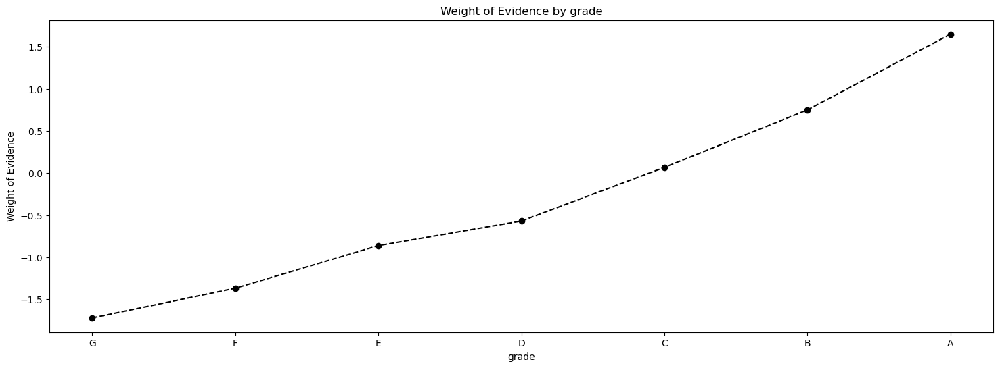

In [383]:
plot_by_woe(df_woe_grade)

In [384]:
df_home_ownership = woe_discrete(df_inputs_preprocess, 'home_ownership', df_target_preprocess)
df_home_ownership

,home_ownership,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,RENT,167644,0.02,0.98,0.40,163777.00,3867.00,0.40,0.49,-0.22,NaN,inf
1,OWN,45766,0.02,0.98,0.11,44885.00,881.00,0.11,0.11,-0.03,0.18,inf
2,MORTGAGE,207682,0.01,0.99,0.49,204579.00,3103.00,0.50,0.40,0.23,0.26,inf
3,ANY,2,0.00,1.00,0.00,2.00,0.00,0.00,0.00,inf,inf,inf


In [385]:
#Any category need to be combined because no. of bad is 0.

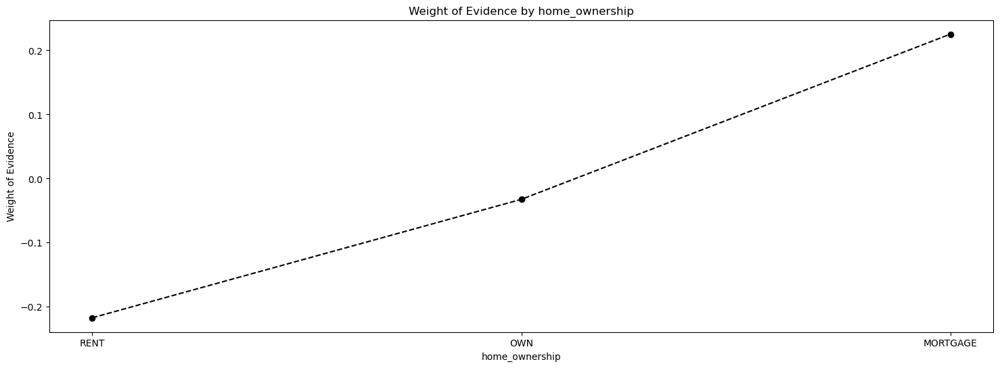

In [386]:
plot_by_woe(df_home_ownership)

In [387]:
#Since frequency of Other, None, Any is very less and risk level is same as rent, so we can combine other, none, any, rent
#Hence, we have 3 categories now, Rent, Own, Mortgage

In [388]:
df_inputs_preprocess['home_ownership:Rent_Other_None_Any'] = (df_inputs_preprocess['home_ownership:RENT'] +
                                                df_inputs_preprocess['home_ownership:ANY'])

In [389]:
df_inputs_preprocess['addr_state'].unique()

array(['DC', 'IN', 'KS', 'IL', 'OR', 'VA', 'PA', 'GA', 'TN', 'OH', 'NY',
       'FL', 'NJ', 'RI', 'NC', 'AL', 'TX', 'SC', 'MD', 'WA', 'MO', 'MN',
       'NH', 'VT', 'AZ', 'MI', 'MA', 'CA', 'LA', 'DE', 'NM', 'CO', 'WI',
       'SD', 'CT', 'NE', 'HI', 'AR', 'MT', 'WV', 'WY', 'OK', 'NV', 'KY',
       'MS', 'ME', 'UT', 'ND', 'AK'], dtype=object)

In [390]:
df_addr_state = woe_discrete(df_inputs_preprocess, 'addr_state', df_target_preprocess)
df_addr_state

,addr_state,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,NV,5924,0.03,0.97,0.01,5746.00,178.00,0.01,0.02,-0.49,NaN,inf
1,SD,835,0.03,0.97,0.00,810.00,25.00,0.00,0.00,-0.49,0.00,inf
2,HI,2083,0.03,0.97,0.00,2028.00,55.00,0.00,0.01,-0.36,0.13,inf
3,OK,3968,0.02,0.98,0.01,3874.00,94.00,0.01,0.01,-0.24,0.11,inf
4,AK,954,0.02,0.98,0.00,933.00,21.00,0.00,0.00,-0.17,0.08,inf
5,NY,33844,0.02,0.98,0.08,33108.00,736.00,0.08,0.09,-0.16,0.01,inf
6,AL,5347,0.02,0.98,0.01,5231.00,116.00,0.01,0.01,-0.15,0.00,inf
7,UT,2836,0.02,0.98,0.01,2775.00,61.00,0.01,0.01,-0.15,0.01,inf
8,WY,900,0.02,0.98,0.00,881.00,19.00,0.00,0.00,-0.13,0.02,inf
9,FL,29298,0.02,0.98,0.07,28686.00,612.00,0.07,0.08,-0.12,0.01,inf


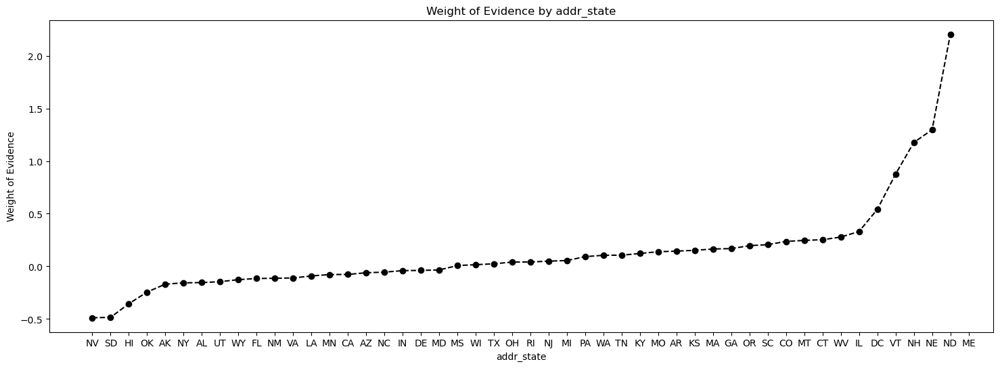

In [391]:
plot_by_woe(df_addr_state)

In [392]:
if ['addr_state:ND'] in df_inputs_preprocess.columns.values:
    pass
else:
    df_inputs_preprocess['addr_state:ND'] = 0

In [393]:
if ['addr_state:ID'] in df_inputs_preprocess.columns.values:
    pass
else:
    df_inputs_preprocess['addr_state:ID'] = 0

In [394]:
if ['addr_state:IA'] in df_inputs_preprocess.columns.values:
    pass
else:
    df_inputs_preprocess['addr_state:IA'] = 0

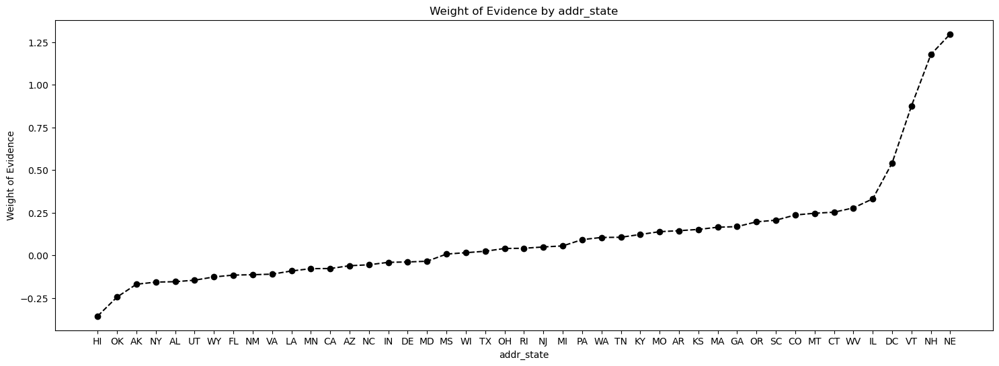

In [395]:
plot_by_woe(df_addr_state.iloc[2:-2])

In [396]:
df_inputs_preprocess['addr_state:ND_NE_IA_NV_FL_HI_AL'] = sum([df_inputs_preprocess['addr_state:ND'], df_inputs_preprocess['addr_state:NE'],
                                              df_inputs_preprocess['addr_state:IA'], df_inputs_preprocess['addr_state:NV'],
                                              df_inputs_preprocess['addr_state:FL'], df_inputs_preprocess['addr_state:HI'],
                                                          df_inputs_preprocess['addr_state:AL']])

df_inputs_preprocess['addr_state:NM_VA'] = sum([df_inputs_preprocess['addr_state:NM'], df_inputs_preprocess['addr_state:VA']])

df_inputs_preprocess['addr_state:OK_TN_MO_LA_MD_NC'] = sum([df_inputs_preprocess['addr_state:OK'], df_inputs_preprocess['addr_state:TN'],
                                              df_inputs_preprocess['addr_state:MO'], df_inputs_preprocess['addr_state:LA'],
                                              df_inputs_preprocess['addr_state:MD'], df_inputs_preprocess['addr_state:NC']])

df_inputs_preprocess['addr_state:UT_KY_AZ_NJ'] = sum([df_inputs_preprocess['addr_state:UT'], df_inputs_preprocess['addr_state:KY'],
                                              df_inputs_preprocess['addr_state:AZ'], df_inputs_preprocess['addr_state:NJ']])

df_inputs_preprocess['addr_state:AR_MI_PA_OH_MN'] = sum([df_inputs_preprocess['addr_state:AR'], df_inputs_preprocess['addr_state:MI'],
                                              df_inputs_preprocess['addr_state:PA'], df_inputs_preprocess['addr_state:OH'],
                                              df_inputs_preprocess['addr_state:MN']])

df_inputs_preprocess['addr_state:RI_MA_DE_SD_IN'] = sum([df_inputs_preprocess['addr_state:RI'], df_inputs_preprocess['addr_state:MA'],
                                              df_inputs_preprocess['addr_state:DE'], df_inputs_preprocess['addr_state:SD'],
                                              df_inputs_preprocess['addr_state:IN']])

df_inputs_preprocess['addr_state:GA_WA_OR'] = sum([df_inputs_preprocess['addr_state:GA'], df_inputs_preprocess['addr_state:WA'],
                                              df_inputs_preprocess['addr_state:OR']])

df_inputs_preprocess['addr_state:WI_MT'] = sum([df_inputs_preprocess['addr_state:WI'], df_inputs_preprocess['addr_state:MT']])

df_inputs_preprocess['addr_state:IL_CT'] = sum([df_inputs_preprocess['addr_state:IL'], df_inputs_preprocess['addr_state:CT']])

df_inputs_preprocess['addr_state:KS_SC_CO_VT_AK_MS'] = sum([df_inputs_preprocess['addr_state:KS'], df_inputs_preprocess['addr_state:SC'],
                                              df_inputs_preprocess['addr_state:CO'], df_inputs_preprocess['addr_state:VT'],
                                              df_inputs_preprocess['addr_state:AK'], df_inputs_preprocess['addr_state:MS']])

df_inputs_preprocess['addr_state:WV_NH_WY_DC_ME_ID'] = sum([df_inputs_preprocess['addr_state:WV'], df_inputs_preprocess['addr_state:NH'],
                                              df_inputs_preprocess['addr_state:WY'], df_inputs_preprocess['addr_state:DC'],
                                              df_inputs_preprocess['addr_state:ME'], df_inputs_preprocess['addr_state:ID']])

In [397]:
#WoE for column: verification_status
df_inputs_preprocess['verification_status'].unique()

array(['Source Verified', 'Not Verified', 'Verified'], dtype=object)

In [398]:
df_verification_status = woe_discrete(df_inputs_preprocess, 'verification_status', df_target_preprocess)
df_verification_status

,verification_status,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,Verified,123016,0.02,0.98,0.29,120129.00,2887.00,0.29,0.37,-0.24,NaN,0.05
1,Source Verified,179565,0.02,0.98,0.43,176173.00,3392.00,0.43,0.43,-0.01,0.22,0.05
2,Not Verified,118513,0.01,0.99,0.28,116941.00,1572.00,0.28,0.20,0.35,0.36,0.05


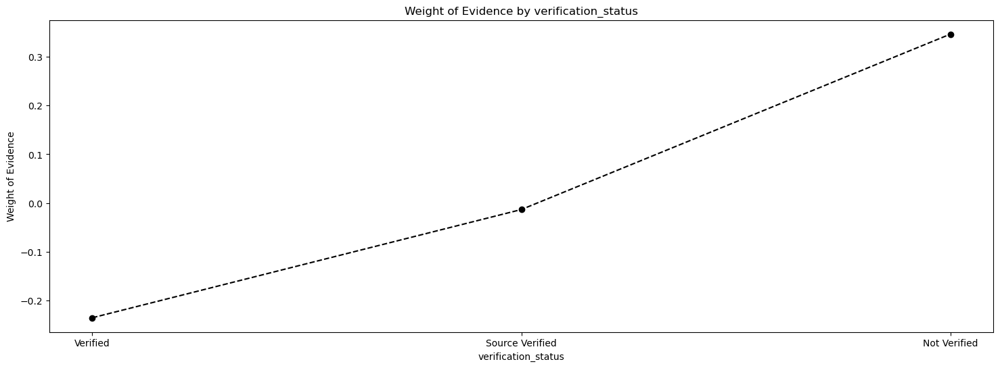

In [399]:
plot_by_woe(df_verification_status)

In [400]:
#WoE for column: purpose
df_inputs_preprocess['purpose'].unique()

array(['home_improvement', 'credit_card', 'debt_consolidation',
       'major_purchase', 'other', 'medical', 'small_business', 'house',
       'car', 'vacation', 'moving', 'renewable_energy', 'wedding',
       'educational'], dtype=object)

In [401]:
df_purpose = woe_discrete(df_inputs_preprocess, 'purpose', df_target_preprocess)
df_purpose

,purpose,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,wedding,4,0.25,0.75,0.00,3.00,1.00,0.00,0.00,-2.86,NaN,inf
1,renewable_energy,224,0.04,0.96,0.00,214.00,10.00,0.00,0.00,-0.90,1.96,inf
2,small_business,3364,0.04,0.96,0.01,3225.00,139.00,0.01,0.02,-0.82,0.08,inf
3,moving,2420,0.03,0.97,0.01,2336.00,84.00,0.01,0.01,-0.64,0.18,inf
4,house,1438,0.03,0.97,0.00,1391.00,47.00,0.00,0.01,-0.58,0.06,inf
5,medical,3938,0.03,0.97,0.01,3823.00,115.00,0.01,0.01,-0.46,0.12,inf
6,major_purchase,7449,0.02,0.98,0.02,7270.00,179.00,0.02,0.02,-0.26,0.20,inf
7,other,19204,0.02,0.98,0.05,18756.00,448.00,0.05,0.06,-0.23,0.03,inf
8,vacation,2249,0.02,0.98,0.01,2199.00,50.00,0.01,0.01,-0.18,0.05,inf
9,debt_consolidation,250020,0.02,0.98,0.59,244989.00,5031.00,0.59,0.64,-0.08,0.10,inf


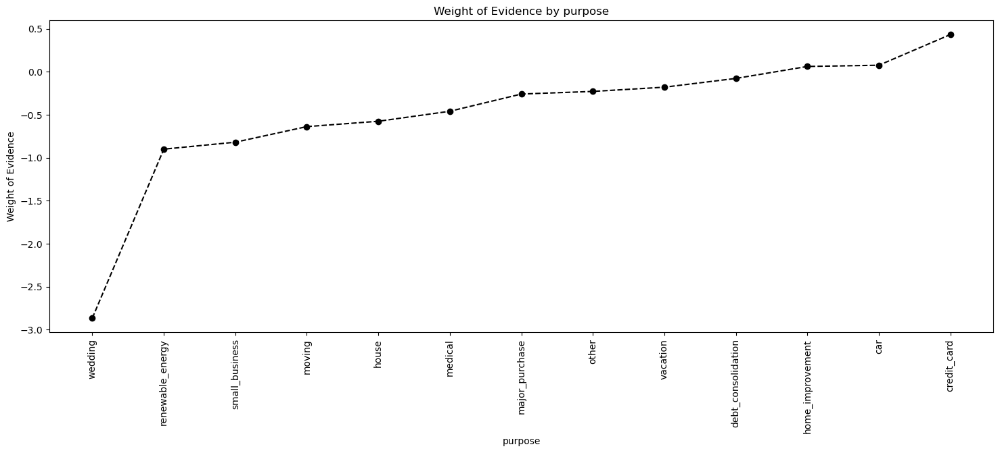

In [402]:
plot_by_woe(df_purpose, rotation_of_x_label = 90)

In [403]:
# We combine 'educational', 'small_business', 'wedding', 'renewable_energy', 'moving', 'house' in one category: 'educ__sm_b__wedd__ren_en__mov__house'.
# We combine 'other', 'medical', 'vacation' in one category: 'oth__med__vacation'.
# We combine 'major_purchase', 'car', 'home_improvement' in one category: 'major_purch__car__home_impr'.
# We leave 'debt_consolidtion' in a separate category.
# We leave 'credit_card' in a separate category.

In [404]:
df_inputs_preprocess['purpose:educ__sm_b__wedd__ren_en__mov__house'] = sum([df_inputs_preprocess['purpose:educational'], 
                                                                       df_inputs_preprocess['purpose:small_business'],                                                                
                                                                       df_inputs_preprocess['purpose:wedding'], 
                                                                       df_inputs_preprocess['purpose:renewable_energy'],
                                                                       df_inputs_preprocess['purpose:moving'], 
                                                                       df_inputs_preprocess['purpose:house']])

df_inputs_preprocess['purpose:oth__med__vacation'] = sum([df_inputs_preprocess['purpose:other'],
                                                     df_inputs_preprocess['purpose:medical'],  
                                                     df_inputs_preprocess['purpose:vacation']])

df_inputs_preprocess['purpose:major_purch__car__home_impr'] = sum([df_inputs_preprocess['purpose:major_purchase'],
                                                              df_inputs_preprocess['purpose:car'],
                                                              df_inputs_preprocess['purpose:home_improvement']])

In [405]:
#WoE for column: initial_list_status
df_inputs_preprocess['initial_list_status'].unique()

array(['w', 'f'], dtype=object)

In [406]:
df_initial_list_status = woe_discrete(df_inputs_preprocess, 'initial_list_status', df_target_preprocess)
df_initial_list_status

,initial_list_status,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,f,153843,0.03,0.97,0.37,149620.00,4223.00,0.36,0.54,-0.40,NaN,0.13
1,w,267251,0.01,0.99,0.63,263623.00,3628.00,0.64,0.46,0.32,0.72,0.13


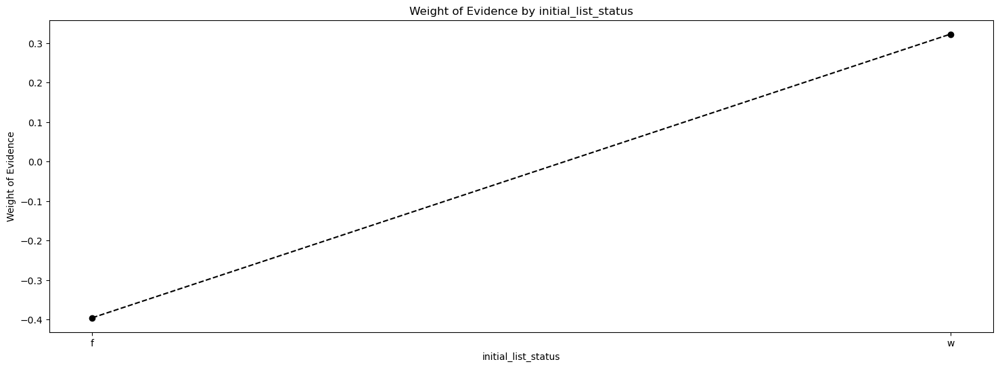

In [407]:
plot_by_woe(df_initial_list_status)

#### Data Prep for Continuous independent variables

In [408]:
def woe_cont(df, cont_variable_name, good_bad_variable_df):
    df = pd.concat([df[cont_variable_name], good_bad_variable_df], axis = 1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
               df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()],
               axis = 1)
    df = df.iloc[: , [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_bad']
    df['prop_good'] = 1 - df['prop_bad']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = df['prop_bad'] * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good']/df['prop_n_bad'])
    df['diff_WoE'] = df['WoE'].diff().abs()
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df

In [409]:
df_inputs_preprocess['term_int'].unique() 

array([60, 36], dtype=int64)

In [410]:
#No need to create bins, we have just two values

In [411]:
df_term_int = woe_cont(df_inputs_preprocess, 'term_int', df_target_preprocess)
df_term_int

,term_int,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,36,283172,0.02,0.98,0.67,278509.00,4663.00,0.67,0.59,0.13,NaN,0.03
1,60,137922,0.02,0.98,0.33,134734.00,3188.00,0.33,0.41,-0.22,0.35,0.03


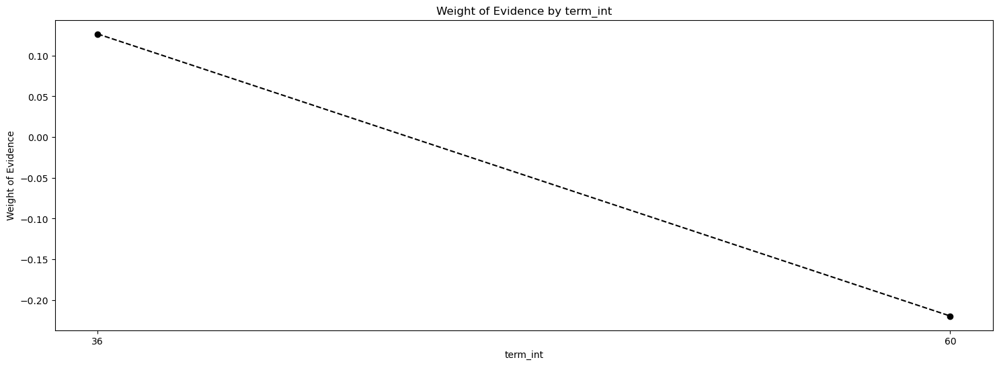

In [412]:
plot_by_woe(df_term_int)

In [413]:
#60 months loans are much riskier than 36 loans

In [414]:
df_inputs_preprocess['term:36'] = np.where((df_inputs_preprocess['term_int'] == 36), 1, 0)

In [415]:
df_inputs_preprocess['term:60'] = np.where((df_inputs_preprocess['term_int'] == 60), 1, 0)

In [416]:
df_inputs_preprocess['emp_length_int'].unique()

array([10.,  0.,  5.,  3.,  4.,  2.,  8.,  9.,  1.,  6.,  7.])

In [417]:
#Fine classing is not required

In [418]:
df_emp_length_int = woe_cont(df_inputs_preprocess, 'emp_length_int', df_target_preprocess)
df_emp_length_int

,emp_length_int,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,0.00,58157,0.02,0.98,0.14,56862.00,1295.00,0.14,0.16,-0.18,NaN,0.02
1,1.00,27473,0.02,0.98,0.07,26860.00,613.00,0.06,0.08,-0.18,0.00,0.02
2,2.00,37497,0.02,0.98,0.09,36782.00,715.00,0.09,0.09,-0.02,0.16,0.02
3,3.00,33430,0.02,0.98,0.08,32794.00,636.00,0.08,0.08,-0.02,0.00,0.02
4,4.00,24506,0.02,0.98,0.06,24008.00,498.00,0.06,0.06,-0.09,0.07,0.02
5,5.00,24930,0.02,0.98,0.06,24453.00,477.00,0.06,0.06,-0.03,0.06,0.02
6,6.00,16838,0.02,0.98,0.04,16484.00,354.00,0.04,0.05,-0.12,0.10,0.02
7,7.00,18414,0.02,0.98,0.04,18031.00,383.00,0.04,0.05,-0.11,0.01,0.02
8,8.00,21560,0.02,0.98,0.05,21213.00,347.00,0.05,0.04,0.15,0.26,0.02
9,9.00,16769,0.02,0.98,0.04,16472.00,297.00,0.04,0.04,0.05,0.10,0.02


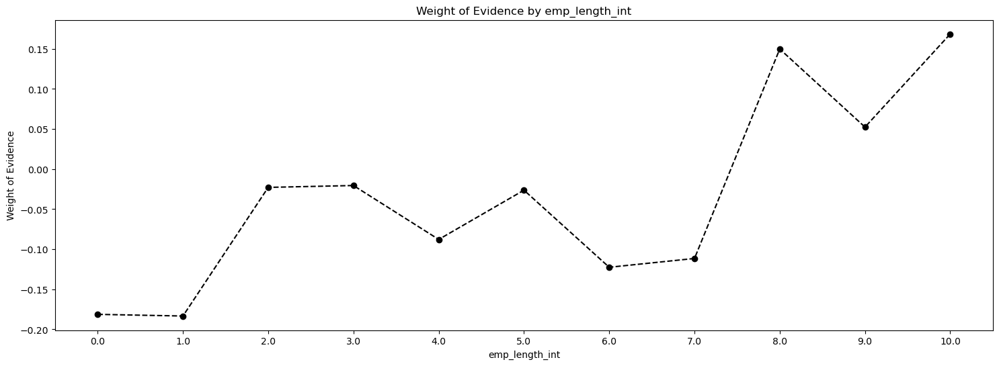

In [419]:
plot_by_woe(df_emp_length_int)

In [420]:
df_inputs_preprocess['emp_length_int:0'] = np.where(df_inputs_preprocess['emp_length_int'].isin([0]), 1, 0)
df_inputs_preprocess['emp_length_int:1'] = np.where(df_inputs_preprocess['emp_length_int'].isin([1]), 1, 0)
df_inputs_preprocess['emp_length_int:2-4'] = np.where(df_inputs_preprocess['emp_length_int'].isin(range(2,5)), 1, 0)
df_inputs_preprocess['emp_length_int:5-6'] = np.where(df_inputs_preprocess['emp_length_int'].isin(range(5,7)), 1, 0)
df_inputs_preprocess['emp_length_int:7-9'] = np.where(df_inputs_preprocess['emp_length_int'].isin(range(7,10)), 1, 0)
df_inputs_preprocess['emp_length_int:10'] = np.where(df_inputs_preprocess['emp_length_int'].isin([10]), 1, 0)

In [421]:
#Loan Age

In [422]:
df_inputs_preprocess['mths_since_issue_d'].unique()

array([24., 25., 26., 27., 28., 29., 30., 31., 32., 33., 34., 35.])

In [423]:
#Fine classing
df_inputs_preprocess['mths_since_issue_d_factor'] = pd.cut(df_inputs_preprocess['mths_since_issue_d'], bins=50)

In [424]:
#df_inputs_preprocess['mths_since_issue_d_factor']
#Commenting because taking a lot of time to execute 

In [425]:
df_mths_since_issue_d_factor = woe_cont(df_inputs_preprocess,'mths_since_issue_d_factor', df_target_preprocess)
df_mths_since_issue_d_factor

,mths_since_issue_d_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(23.989, 24.22]",44342,0.00,1.00,0.11,44342.00,0.00,0.11,0.00,inf,NaN,inf
1,"(24.22, 24.44]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
2,"(24.44, 24.66]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
3,"(24.66, 24.88]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
4,"(24.88, 25.1]",37530,0.00,1.00,0.09,37458.00,72.00,0.09,0.01,2.29,NaN,inf
5,"(25.1, 25.32]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
6,"(25.32, 25.54]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
7,"(25.54, 25.76]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
8,"(25.76, 25.98]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
9,"(25.98, 26.2]",48631,0.00,1.00,0.12,48501.00,130.00,0.12,0.02,1.96,NaN,inf


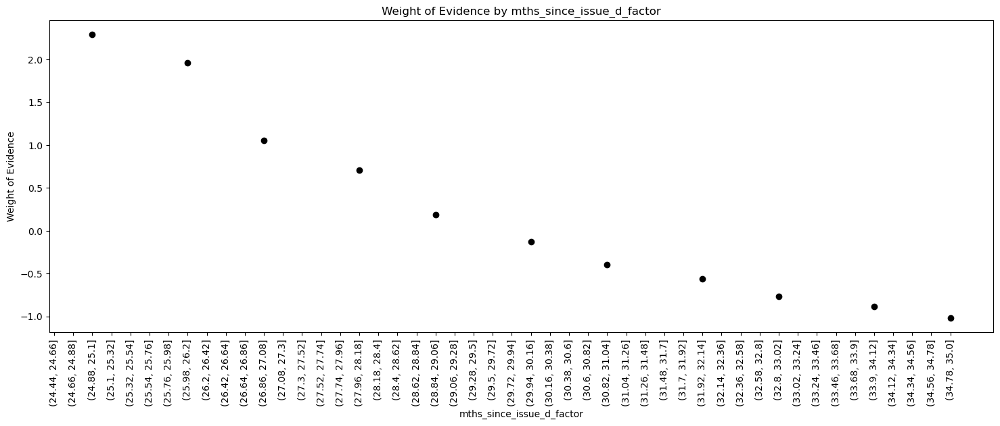

In [426]:
plot_by_woe(df_mths_since_issue_d_factor, rotation_of_x_label = 90)

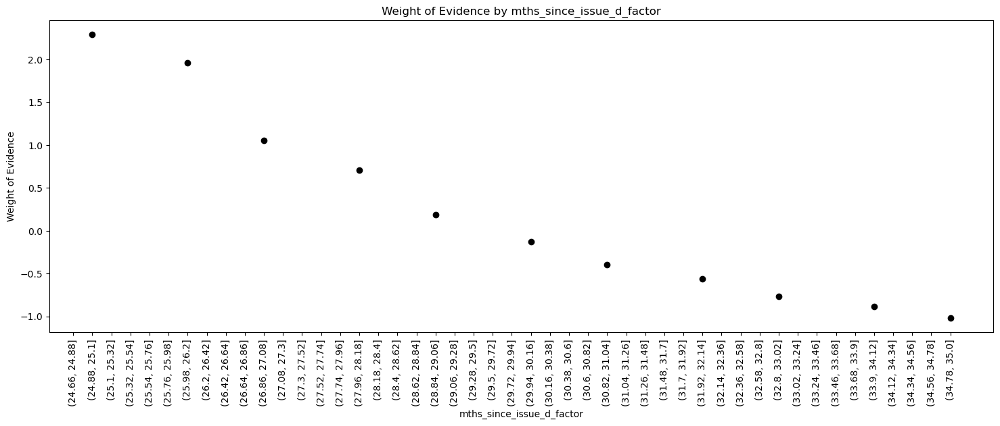

In [427]:
plot_by_woe(df_mths_since_issue_d_factor[3:], rotation_of_x_label = 90)

In [428]:
#We create the following categories:
# < 38, 38 - 39, 40 - 41, 42 - 48, 49 - 52, 53 - 64, 65 - 84, > 84.
df_inputs_preprocess['mths_since_issue_d:<38'] = np.where(df_inputs_preprocess['mths_since_issue_d'].isin(range(38)), 1, 0)
df_inputs_preprocess['mths_since_issue_d:38-39'] = np.where(df_inputs_preprocess['mths_since_issue_d'].isin(range(38, 40)), 1, 0)
df_inputs_preprocess['mths_since_issue_d:40-41'] = np.where(df_inputs_preprocess['mths_since_issue_d'].isin(range(40, 42)), 1, 0)
df_inputs_preprocess['mths_since_issue_d:42-48'] = np.where(df_inputs_preprocess['mths_since_issue_d'].isin(range(42, 49)), 1, 0)
df_inputs_preprocess['mths_since_issue_d:49-52'] = np.where(df_inputs_preprocess['mths_since_issue_d'].isin(range(49, 53)), 1, 0)
df_inputs_preprocess['mths_since_issue_d:53-64'] = np.where(df_inputs_preprocess['mths_since_issue_d'].isin(range(53, 65)), 1, 0)
df_inputs_preprocess['mths_since_issue_d:65-84'] = np.where(df_inputs_preprocess['mths_since_issue_d'].isin(range(65, 85)), 1, 0)
df_inputs_preprocess['mths_since_issue_d:>84'] = np.where(df_inputs_preprocess['mths_since_issue_d'].isin(range(85, int(df_inputs_preprocess['mths_since_issue_d'].max()))), 1, 0)

In [429]:
#Interest Rate

In [430]:
df_inputs_preprocess['int_rate_factor'] = pd.cut(df_inputs_preprocess['int_rate'], bins = 50)

In [431]:
df_int_rate_factor = woe_cont(df_inputs_preprocess, 'int_rate_factor', df_target_preprocess)
df_int_rate_factor

,int_rate_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(5.296, 5.793]",9651,0.00,1.00,0.02,9648.00,3.00,0.02,0.00,4.11,NaN,inf
1,"(5.793, 6.267]",10214,0.00,1.00,0.02,10186.00,28.00,0.02,0.00,1.93,2.18,inf
2,"(6.267, 6.74]",6530,0.01,0.99,0.02,6496.00,34.00,0.02,0.00,1.29,0.64,inf
3,"(6.74, 7.214]",12488,0.00,1.00,0.03,12429.00,59.00,0.03,0.01,1.39,0.10,inf
4,"(7.214, 7.687]",11416,0.00,1.00,0.03,11393.00,23.00,0.03,0.00,2.24,0.86,inf
5,"(7.687, 8.16]",20636,0.00,1.00,0.05,20547.00,89.00,0.05,0.01,1.48,0.76,inf
6,"(8.16, 8.634]",22498,0.01,0.99,0.05,22366.00,132.00,0.05,0.02,1.17,0.31,inf
7,"(8.634, 9.107]",2020,0.02,0.98,0.00,1979.00,41.00,0.00,0.01,-0.09,1.26,inf
8,"(9.107, 9.581]",22171,0.01,0.99,0.05,22011.00,160.00,0.05,0.02,0.96,1.05,inf
9,"(9.581, 10.054]",22364,0.01,0.99,0.05,22226.00,138.00,0.05,0.02,1.12,0.16,inf


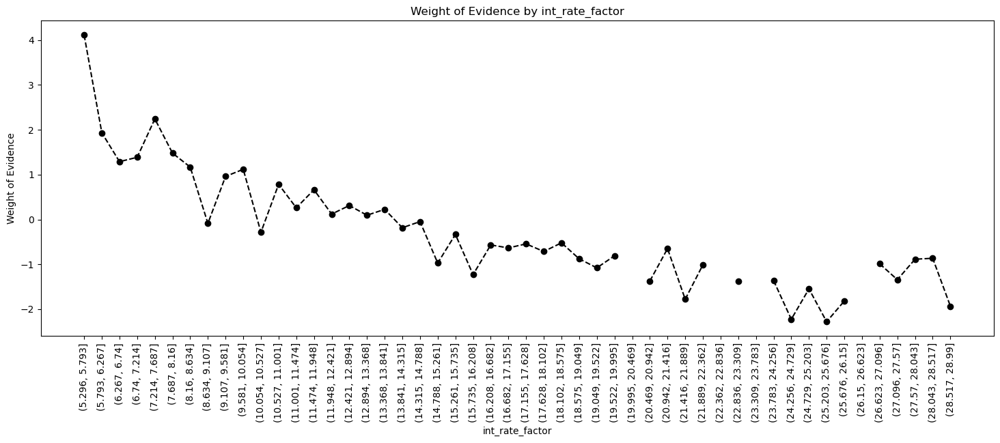

In [432]:
plot_by_woe(df_int_rate_factor, 90)

In [433]:
#The greater the int rate, lower the WoE, higher PD

In [434]:
df_inputs_preprocess['int_rate:<9.548'] = np.where((df_inputs_preprocess['int_rate'] <= 9.548), 1, 0)
df_inputs_preprocess['int_rate:9.548-12.025'] = np.where((df_inputs_preprocess['int_rate'] > 9.548) & (df_inputs_preprocess['int_rate'] <= 12.025), 1, 0)
df_inputs_preprocess['int_rate:12.025-15.74'] = np.where((df_inputs_preprocess['int_rate'] > 12.025) & (df_inputs_preprocess['int_rate'] <= 15.74), 1, 0)
df_inputs_preprocess['int_rate:15.74-20.281'] = np.where((df_inputs_preprocess['int_rate'] > 15.74) & (df_inputs_preprocess['int_rate'] <= 20.281), 1, 0)
df_inputs_preprocess['int_rate:>20.281'] = np.where((df_inputs_preprocess['int_rate'] > 20.281), 1, 0)

In [435]:
#Funded amount factor

In [436]:
df_inputs_preprocess['funded_amnt_factor'] = pd.cut(df_inputs_preprocess['funded_amnt'], 50)

In [437]:
df_funded_amnt_factor = woe_cont(df_inputs_preprocess, 'funded_amnt_factor', df_target_preprocess)
df_funded_amnt_factor

,funded_amnt_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(966.0, 1680.0]",3391,0.02,0.98,0.01,3331.00,60.00,0.01,0.01,0.05,NaN,0.03
1,"(1680.0, 2360.0]",3751,0.02,0.98,0.01,3681.00,70.00,0.01,0.01,-0.00,0.05,0.03
2,"(2360.0, 3040.0]",8134,0.02,0.98,0.02,7981.00,153.00,0.02,0.02,-0.01,0.01,0.03
3,"(3040.0, 3720.0]",5133,0.02,0.98,0.01,5047.00,86.00,0.01,0.01,0.11,0.12,0.03
4,"(3720.0, 4400.0]",7315,0.02,0.98,0.02,7169.00,146.00,0.02,0.02,-0.07,0.18,0.03
5,"(4400.0, 5080.0]",18150,0.02,0.98,0.04,17832.00,318.00,0.04,0.04,0.06,0.13,0.03
6,"(5080.0, 5760.0]",5617,0.02,0.98,0.01,5532.00,85.00,0.01,0.01,0.21,0.15,0.03
7,"(5760.0, 6440.0]",16224,0.02,0.98,0.04,15942.00,282.00,0.04,0.04,0.07,0.14,0.03
8,"(6440.0, 7120.0]",10565,0.02,0.98,0.03,10380.00,185.00,0.03,0.02,0.06,0.01,0.03
9,"(7120.0, 7800.0]",8423,0.02,0.98,0.02,8256.00,167.00,0.02,0.02,-0.06,0.13,0.03


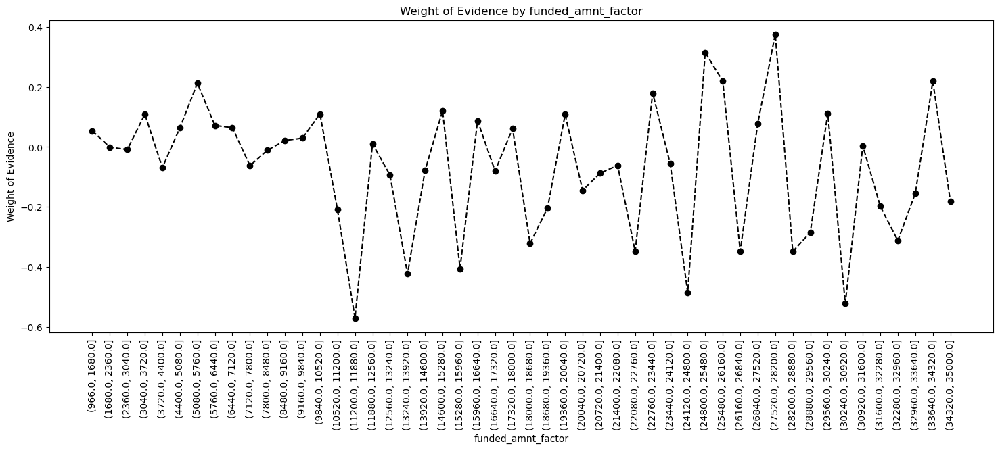

In [438]:
plot_by_woe(df_funded_amnt_factor, 90)

In [439]:
#Observation: No association - drop funded amount variable

In [440]:
#month_since_earliest_cr_line

In [441]:
df_inputs_preprocess['month_since_earliest_cr_line'].nunique()

527

In [442]:
df_inputs_preprocess['month_since_earliest_cr_line_factor'] = pd.cut(df_inputs_preprocess['month_since_earliest_cr_line'], 50)

In [443]:
month_since_earliest_cr_line_factor = woe_cont(df_inputs_preprocess, 'month_since_earliest_cr_line_factor', df_target_preprocess)
month_since_earliest_cr_line_factor

,month_since_earliest_cr_line_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(60.474, 71.52]",2001,0.02,0.98,0.00,1970.00,31.00,0.00,0.00,0.19,NaN,0.04
1,"(71.52, 82.04]",4886,0.03,0.97,0.01,4761.00,125.00,0.01,0.02,-0.32,0.51,0.04
2,"(82.04, 92.56]",4610,0.03,0.97,0.01,4481.00,129.00,0.01,0.02,-0.42,0.09,0.04
3,"(92.56, 103.08]",5446,0.02,0.98,0.01,5314.00,132.00,0.01,0.02,-0.27,0.15,0.04
4,"(103.08, 113.6]",6146,0.03,0.97,0.01,5951.00,195.00,0.01,0.02,-0.55,0.28,0.04
5,"(113.6, 124.12]",10200,0.02,0.98,0.02,9977.00,223.00,0.02,0.03,-0.16,0.38,0.04
6,"(124.12, 134.64]",11155,0.03,0.97,0.03,10869.00,286.00,0.03,0.04,-0.33,0.16,0.04
7,"(134.64, 145.16]",15641,0.02,0.98,0.04,15283.00,358.00,0.04,0.05,-0.21,0.12,0.04
8,"(145.16, 155.68]",18480,0.02,0.98,0.04,18097.00,383.00,0.04,0.05,-0.11,0.10,0.04
9,"(155.68, 166.2]",24374,0.02,0.98,0.06,23815.00,559.00,0.06,0.07,-0.21,0.10,0.04


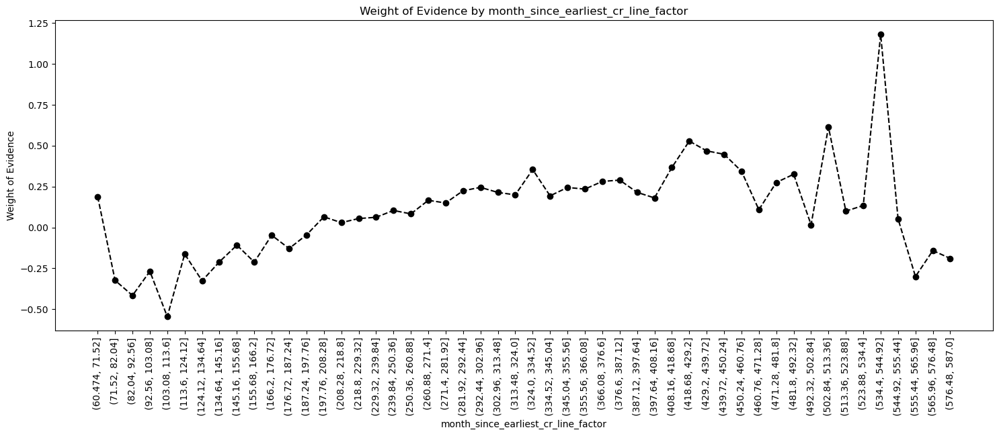

In [444]:
plot_by_woe(month_since_earliest_cr_line_factor, 90)

In [445]:
df_inputs_preprocess['month_since_earliest_cr_line:<140'] = np.where(df_inputs_preprocess['month_since_earliest_cr_line'].isin(range(140)), 1, 0)
df_inputs_preprocess['month_since_earliest_cr_line:141-164'] = np.where(df_inputs_preprocess['month_since_earliest_cr_line'].isin(range(140, 165)), 1, 0)
df_inputs_preprocess['month_since_earliest_cr_line:165-247'] = np.where(df_inputs_preprocess['month_since_earliest_cr_line'].isin(range(165, 248)), 1, 0)
df_inputs_preprocess['month_since_earliest_cr_line:248-270'] = np.where(df_inputs_preprocess['month_since_earliest_cr_line'].isin(range(248, 271)), 1, 0)
df_inputs_preprocess['month_since_earliest_cr_line:271-352'] = np.where(df_inputs_preprocess['month_since_earliest_cr_line'].isin(range(271, 353)), 1, 0)
df_inputs_preprocess['month_since_earliest_cr_line:>352'] = np.where(df_inputs_preprocess['month_since_earliest_cr_line'].isin(range(353, int(df_inputs_preprocess['month_since_earliest_cr_line'].max()))), 1, 0)

In [446]:
#installment

In [447]:
df_inputs_preprocess['installment'].nunique()

40447

In [448]:
df_inputs_preprocess['installment_factor'] = pd.cut(df_inputs_preprocess['installment'], 50)

In [449]:
installment_factor = woe_cont(df_inputs_preprocess, 'installment_factor', df_target_preprocess)
installment_factor

,installment_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(28.705, 58.427]",3506,0.02,0.98,0.01,3446.00,60.00,0.01,0.01,0.09,NaN,inf
1,"(58.427, 86.734]",5832,0.02,0.98,0.01,5723.00,109.00,0.01,0.01,-0.00,0.09,inf
2,"(86.734, 115.04]",8123,0.02,0.98,0.02,7986.00,137.00,0.02,0.02,0.10,0.10,inf
3,"(115.04, 143.347]",9139,0.02,0.98,0.02,8978.00,161.00,0.02,0.02,0.06,0.04,inf
4,"(143.347, 171.654]",17953,0.02,0.98,0.04,17674.00,279.00,0.04,0.04,0.19,0.13,inf
5,"(171.654, 199.961]",15515,0.01,0.99,0.04,15293.00,222.00,0.04,0.03,0.27,0.08,inf
6,"(199.961, 228.268]",16515,0.02,0.98,0.04,16232.00,283.00,0.04,0.04,0.09,0.18,inf
7,"(228.268, 256.574]",22043,0.02,0.98,0.05,21669.00,374.00,0.05,0.05,0.10,0.01,inf
8,"(256.574, 284.881]",25323,0.02,0.98,0.06,24841.00,482.00,0.06,0.06,-0.02,0.12,inf
9,"(284.881, 313.188]",24135,0.02,0.98,0.06,23663.00,472.00,0.06,0.06,-0.05,0.03,inf


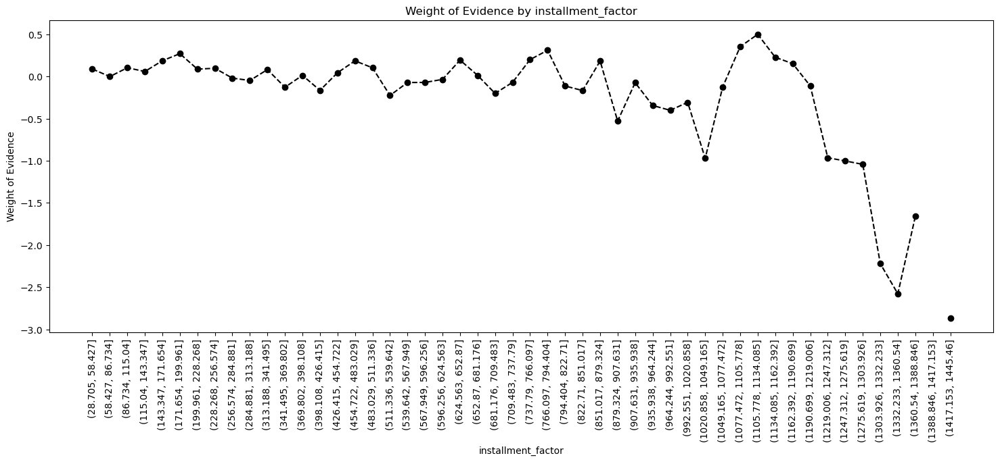

In [450]:
plot_by_woe(installment_factor, 90)

In [451]:
#No of installment is directly related with PD

In [452]:
#delinq_2yrs

In [453]:
df_inputs_preprocess['delinq_2yrs'].nunique()

26

In [454]:
delinq_2yrs_factor = woe_cont(df_inputs_preprocess, 'delinq_2yrs', df_target_preprocess)
delinq_2yrs_factor

,delinq_2yrs,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,0.00,334007,0.02,0.98,0.79,327932.00,6075.00,0.79,0.77,0.03,NaN,inf
1,1.00,57000,0.02,0.98,0.14,55874.00,1126.00,0.14,0.14,-0.06,0.08,inf
2,2.00,17241,0.02,0.98,0.04,16881.00,360.00,0.04,0.05,-0.12,0.06,inf
3,3.00,6293,0.02,0.98,0.01,6147.00,146.00,0.01,0.02,-0.22,0.11,inf
4,4.00,2949,0.02,0.98,0.01,2879.00,70.00,0.01,0.01,-0.25,0.02,inf
5,5.00,1475,0.02,0.98,0.00,1443.00,32.00,0.00,0.00,-0.15,0.09,inf
6,6.00,842,0.02,0.98,0.00,826.00,16.00,0.00,0.00,-0.02,0.14,inf
7,7.00,438,0.02,0.98,0.00,431.00,7.00,0.00,0.00,0.16,0.18,inf
8,8.00,284,0.02,0.98,0.00,279.00,5.00,0.00,0.00,0.06,0.10,inf
9,9.00,173,0.02,0.98,0.00,169.00,4.00,0.00,0.00,-0.22,0.28,inf


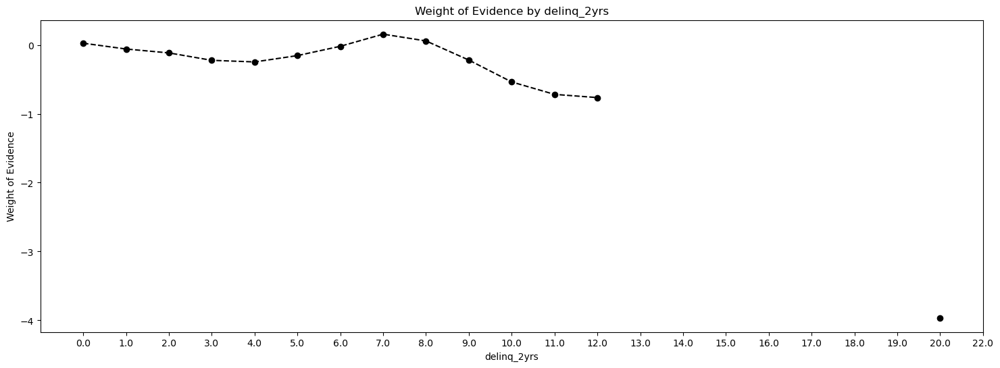

In [455]:
plot_by_woe(delinq_2yrs_factor)

In [456]:
#Categories: 0, 1-3, >=4
df_inputs_preprocess['delinq_2yrs:0'] = np.where((df_inputs_preprocess['delinq_2yrs'] == 0), 1, 0)
df_inputs_preprocess['delinq_2yrs:1-3'] = np.where((df_inputs_preprocess['delinq_2yrs'] >= 1) & (df_inputs_preprocess['delinq_2yrs'] <= 3), 1, 0)
df_inputs_preprocess['delinq_2yrs:>=4'] = np.where((df_inputs_preprocess['delinq_2yrs'] >= 9), 1, 0)

In [457]:
#inq_last_6mths

In [458]:
df_inputs_preprocess['inq_last_6mths'].nunique()

7

In [459]:
inq_last_6mths_factor = woe_cont(df_inputs_preprocess, 'inq_last_6mths', df_target_preprocess)
inq_last_6mths_factor

,inq_last_6mths,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,0.00,256407,0.02,0.98,0.61,252513.00,3894.00,0.61,0.50,0.21,NaN,0.07
1,1.00,111346,0.02,0.98,0.26,108960.00,2386.00,0.26,0.30,-0.14,0.35,0.07
2,2.00,36292,0.03,0.97,0.09,35328.00,964.00,0.09,0.12,-0.36,0.22,0.07
3,3.00,12272,0.04,0.96,0.03,11838.00,434.00,0.03,0.06,-0.66,0.30,0.07
4,4.00,3517,0.03,0.97,0.01,3398.00,119.00,0.01,0.02,-0.61,0.05,0.07
5,5.00,1217,0.04,0.96,0.00,1165.00,52.00,0.00,0.01,-0.85,0.24,0.07
6,6.00,43,0.05,0.95,0.00,41.00,2.00,0.00,0.00,-0.94,0.09,0.07


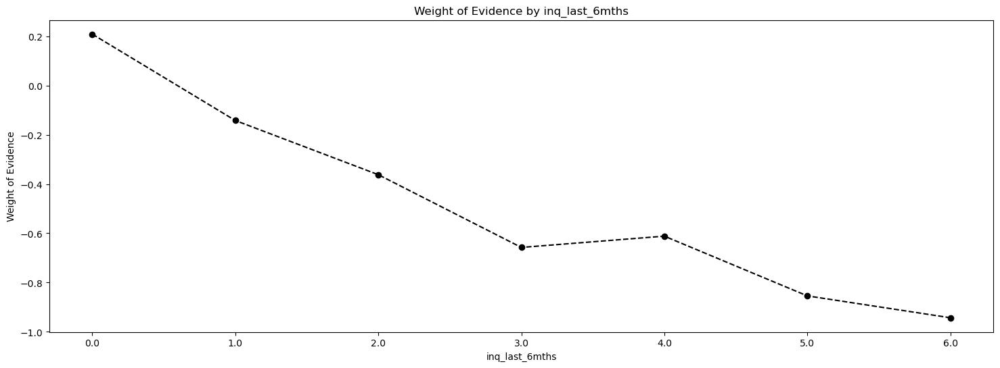

In [460]:
plot_by_woe(inq_last_6mths_factor)

In [461]:
# Categories: 0, 1 - 2, 3 - 6, > 6,
df_inputs_preprocess['inq_last_6mths:0'] = np.where((df_inputs_preprocess['inq_last_6mths'] == 0), 1, 0)
df_inputs_preprocess['inq_last_6mths:1-2'] = np.where((df_inputs_preprocess['inq_last_6mths'] >= 1) & (df_inputs_preprocess['inq_last_6mths'] <= 2), 1, 0)
df_inputs_preprocess['inq_last_6mths:3-6'] = np.where((df_inputs_preprocess['inq_last_6mths'] >= 3) & (df_inputs_preprocess['inq_last_6mths'] <= 6), 1, 0)
df_inputs_preprocess['inq_last_6mths:>6'] = np.where((df_inputs_preprocess['inq_last_6mths'] > 6), 1, 0)

In [462]:
#open_acc

In [463]:
df_inputs_preprocess['open_acc'].nunique()

73

In [464]:
open_acc_factor = woe_cont(df_inputs_preprocess, 'open_acc', df_target_preprocess)
open_acc_factor

,open_acc,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,1.00,90,0.01,0.99,0.00,89.00,1.00,0.00,0.00,0.53,NaN,inf
1,2.00,986,0.03,0.97,0.00,959.00,27.00,0.00,0.00,-0.39,0.92,inf
2,3.00,4119,0.02,0.98,0.01,4055.00,64.00,0.01,0.01,0.19,0.58,inf
3,4.00,10779,0.02,0.98,0.03,10552.00,227.00,0.03,0.03,-0.12,0.31,inf
4,5.00,18222,0.02,0.98,0.04,17871.00,351.00,0.04,0.04,-0.03,0.09,inf
5,6.00,25117,0.02,0.98,0.06,24627.00,490.00,0.06,0.06,-0.05,0.01,inf
6,7.00,30294,0.02,0.98,0.07,29727.00,567.00,0.07,0.07,-0.00,0.04,inf
7,8.00,34685,0.02,0.98,0.08,34022.00,663.00,0.08,0.08,-0.03,0.02,inf
8,9.00,36266,0.02,0.98,0.09,35606.00,660.00,0.09,0.08,0.02,0.05,inf
9,10.00,35809,0.02,0.98,0.09,35116.00,693.00,0.08,0.09,-0.04,0.06,inf


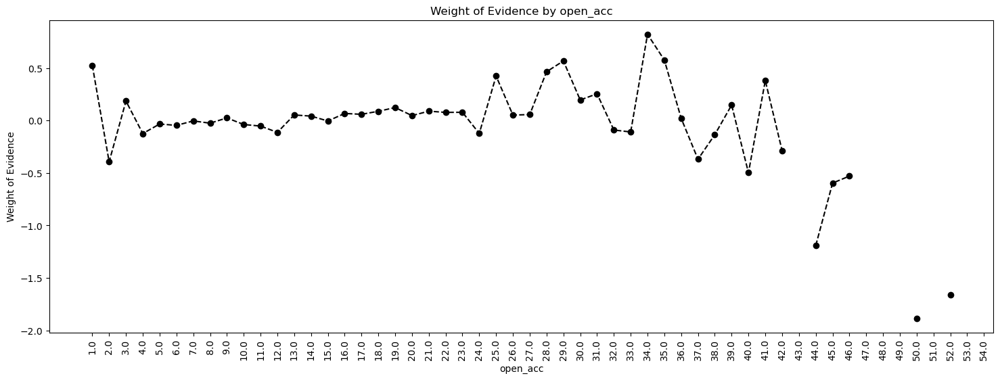

In [465]:
plot_by_woe(open_acc_factor, 90)

In [466]:
# Categories: '0', '1-3', '4-12', '13-17', '18-22', '23-25', '26-30', '>30'
df_inputs_preprocess['open_acc:0'] = np.where((df_inputs_preprocess['open_acc'] == 0), 1, 0)
df_inputs_preprocess['open_acc:1-3'] = np.where((df_inputs_preprocess['open_acc'] >= 1) & (df_inputs_preprocess['open_acc'] <= 3), 1, 0)
df_inputs_preprocess['open_acc:4-12'] = np.where((df_inputs_preprocess['open_acc'] >= 4) & (df_inputs_preprocess['open_acc'] <= 12), 1, 0)
df_inputs_preprocess['open_acc:13-17'] = np.where((df_inputs_preprocess['open_acc'] >= 13) & (df_inputs_preprocess['open_acc'] <= 17), 1, 0)
df_inputs_preprocess['open_acc:18-22'] = np.where((df_inputs_preprocess['open_acc'] >= 18) & (df_inputs_preprocess['open_acc'] <= 22), 1, 0)
df_inputs_preprocess['open_acc:23-25'] = np.where((df_inputs_preprocess['open_acc'] >= 23) & (df_inputs_preprocess['open_acc'] <= 25), 1, 0)
df_inputs_preprocess['open_acc:26-30'] = np.where((df_inputs_preprocess['open_acc'] >= 26) & (df_inputs_preprocess['open_acc'] <= 30), 1, 0)
df_inputs_preprocess['open_acc:>=31'] = np.where((df_inputs_preprocess['open_acc'] >= 31), 1, 0)

In [467]:
#pub_rec

In [468]:
df_inputs_preprocess['pub_rec'].nunique()

28

In [469]:
pub_rec_factor = woe_cont(df_inputs_preprocess, 'pub_rec', df_target_preprocess)
pub_rec_factor

,pub_rec,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,0.00,346679,0.02,0.98,0.82,340298.00,6381.00,0.82,0.81,0.01,NaN,inf
1,1.00,60215,0.02,0.98,0.14,59009.00,1206.00,0.14,0.15,-0.07,0.09,inf
2,2.00,9230,0.02,0.98,0.02,9065.00,165.00,0.02,0.02,0.04,0.12,inf
3,3.00,2876,0.02,0.98,0.01,2818.00,58.00,0.01,0.01,-0.08,0.12,inf
4,4.00,1044,0.02,0.98,0.00,1020.00,24.00,0.00,0.00,-0.21,0.13,inf
5,5.00,481,0.02,0.98,0.00,471.00,10.00,0.00,0.00,-0.11,0.10,inf
6,6.00,249,0.02,0.98,0.00,245.00,4.00,0.00,0.00,0.15,0.26,inf
7,7.00,108,0.00,1.00,0.00,108.00,0.00,0.00,0.00,inf,inf,inf
8,8.00,84,0.00,1.00,0.00,84.00,0.00,0.00,0.00,inf,NaN,inf
9,9.00,34,0.03,0.97,0.00,33.00,1.00,0.00,0.00,-0.47,inf,inf


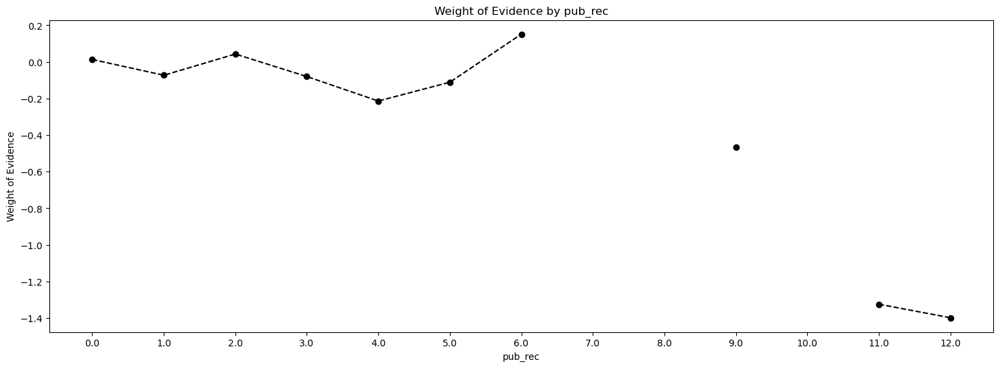

In [470]:
plot_by_woe(pub_rec_factor)

In [471]:
# Categories '0-2', '3-4', '>=5'
df_inputs_preprocess['pub_rec:0-2'] = np.where((df_inputs_preprocess['pub_rec'] >= 0) & (df_inputs_preprocess['pub_rec'] <= 2), 1, 0)
df_inputs_preprocess['pub_rec:3-4'] = np.where((df_inputs_preprocess['pub_rec'] >= 3) & (df_inputs_preprocess['pub_rec'] <= 4), 1, 0)
df_inputs_preprocess['pub_rec:>=5'] = np.where((df_inputs_preprocess['pub_rec'] >= 5), 1, 0)

In [472]:
#total_acc

In [473]:
df_inputs_preprocess['total_acc'].nunique()

126

In [474]:
df_inputs_preprocess['total_acc_factor'] = pd.cut(df_inputs_preprocess['total_acc'], 50)

In [475]:
total_acc_factor = woe_cont(df_inputs_preprocess, 'total_acc_factor', df_target_preprocess)
total_acc_factor

,total_acc_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(3.835, 7.3]",11333,0.02,0.98,0.03,11072.00,261.00,0.03,0.03,-0.22,NaN,inf
1,"(7.3, 10.6]",21005,0.02,0.98,0.05,20580.00,425.00,0.05,0.05,-0.08,0.13,inf
2,"(10.6, 13.9]",31446,0.02,0.98,0.07,30800.00,646.00,0.07,0.08,-0.10,0.02,inf
3,"(13.9, 17.2]",53180,0.02,0.98,0.13,52146.00,1034.00,0.13,0.13,-0.04,0.06,inf
4,"(17.2, 20.5]",44528,0.02,0.98,0.11,43715.00,813.00,0.11,0.10,0.02,0.06,inf
5,"(20.5, 23.8]",44749,0.02,0.98,0.11,43929.00,820.00,0.11,0.10,0.02,0.00,inf
6,"(23.8, 27.1]",55586,0.02,0.98,0.13,54540.00,1046.00,0.13,0.13,-0.01,0.03,inf
7,"(27.1, 30.4]",35493,0.02,0.98,0.08,34867.00,626.00,0.08,0.08,0.06,0.07,inf
8,"(30.4, 33.7]",29540,0.02,0.98,0.07,29028.00,512.00,0.07,0.07,0.07,0.02,inf
9,"(33.7, 37.0]",30463,0.02,0.98,0.07,29927.00,536.00,0.07,0.07,0.06,0.02,inf


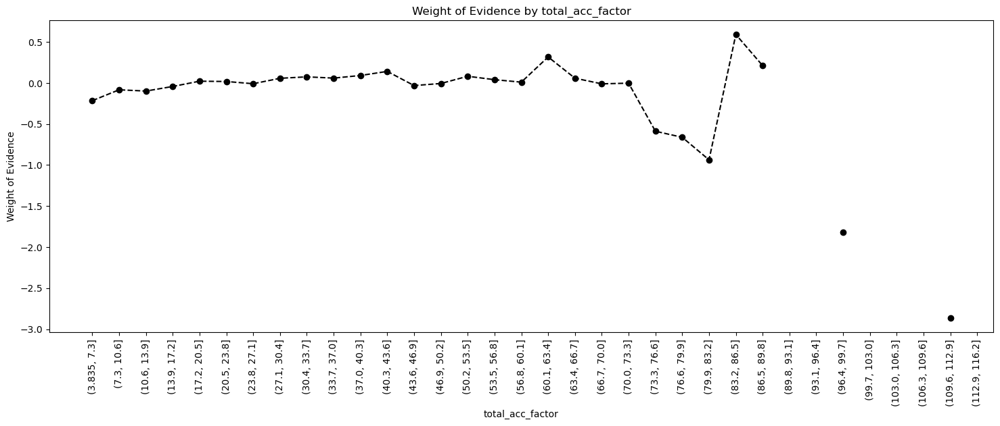

In [476]:
plot_by_woe(total_acc_factor, 90)

In [477]:
# Categories: '<=27', '28-51', '>51'
df_inputs_preprocess['total_acc:<=27'] = np.where((df_inputs_preprocess['total_acc'] <= 27), 1, 0)
df_inputs_preprocess['total_acc:28-51'] = np.where((df_inputs_preprocess['total_acc'] >= 28) & (df_inputs_preprocess['total_acc'] <= 51), 1, 0)
df_inputs_preprocess['total_acc:>=52'] = np.where((df_inputs_preprocess['total_acc'] >= 52), 1, 0)

In [478]:
#acc_now_delinq

In [479]:
df_inputs_preprocess['acc_now_delinq'].nunique()

8

In [480]:
acc_now_delinq_factor = woe_cont(df_inputs_preprocess, 'acc_now_delinq', df_target_preprocess)
acc_now_delinq_factor

,acc_now_delinq,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,0.00,418712,0.02,0.98,0.99,410934.00,7778.00,0.99,0.99,0.00,NaN,inf
1,1.00,2243,0.03,0.97,0.01,2178.00,65.00,0.01,0.01,-0.45,0.46,inf
2,2.00,116,0.06,0.94,0.00,109.00,7.00,0.00,0.00,-1.22,0.77,inf
3,3.00,17,0.00,1.00,0.00,17.00,0.00,0.00,0.00,inf,inf,inf
4,4.00,3,0.33,0.67,0.00,2.00,1.00,0.00,0.00,-3.27,inf,inf
5,5.00,1,0.00,1.00,0.00,1.00,0.00,0.00,0.00,inf,inf,inf
6,6.00,1,0.00,1.00,0.00,1.00,0.00,0.00,0.00,inf,NaN,inf
7,14.00,1,0.00,1.00,0.00,1.00,0.00,0.00,0.00,inf,NaN,inf


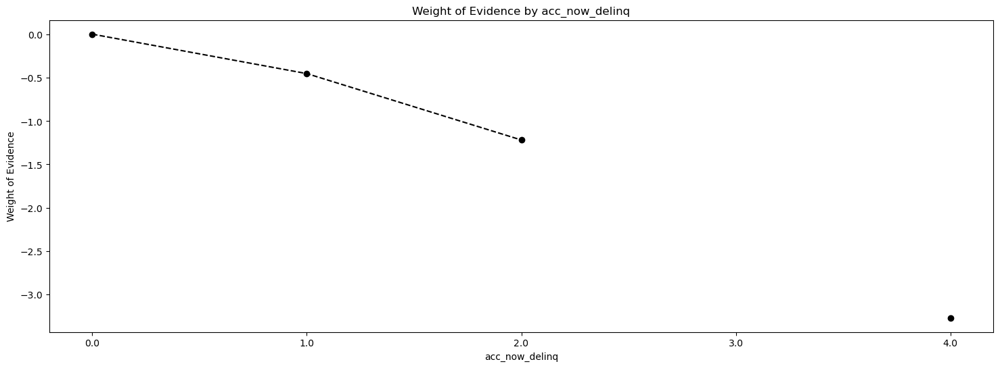

In [481]:
plot_by_woe(acc_now_delinq_factor)

In [482]:
# Categories: '0', '>=1'
df_inputs_preprocess['acc_now_delinq:0'] = np.where((df_inputs_preprocess['acc_now_delinq'] == 0), 1, 0)
df_inputs_preprocess['acc_now_delinq:>=1'] = np.where((df_inputs_preprocess['acc_now_delinq'] >= 1), 1, 0)

In [483]:
#Annual income

In [484]:
df_inputs_preprocess['annual_inc_factor'] = pd.cut(df_inputs_preprocess['annual_inc'], 50)

In [485]:
df_annual_inc_factor = woe_cont(df_inputs_preprocess, 'annual_inc_factor', df_target_preprocess)
df_annual_inc_factor

,annual_inc_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(-9500.0, 190000.0]",409693,0.02,0.98,0.97,401988.00,7705.00,0.97,0.98,-0.01,NaN,inf
1,"(190000.0, 380000.0]",10007,0.01,0.99,0.02,9873.00,134.00,0.02,0.02,0.34,0.35,inf
2,"(380000.0, 570000.0]",943,0.01,0.99,0.00,934.00,9.00,0.00,0.00,0.68,0.34,inf
3,"(570000.0, 760000.0]",257,0.00,1.00,0.00,257.00,0.00,0.00,0.00,inf,inf,inf
4,"(760000.0, 950000.0]",70,0.00,1.00,0.00,70.00,0.00,0.00,0.00,inf,NaN,inf
5,"(950000.0, 1140000.0]",43,0.00,1.00,0.00,43.00,0.00,0.00,0.00,inf,NaN,inf
6,"(1140000.0, 1330000.0]",20,0.05,0.95,0.00,19.00,1.00,0.00,0.00,-1.02,inf,inf
7,"(1330000.0, 1520000.0]",14,0.00,1.00,0.00,14.00,0.00,0.00,0.00,inf,inf,inf
8,"(1520000.0, 1710000.0]",3,0.33,0.67,0.00,2.00,1.00,0.00,0.00,-3.27,inf,inf
9,"(1710000.0, 1900000.0]",5,0.00,1.00,0.00,5.00,0.00,0.00,0.00,inf,inf,inf


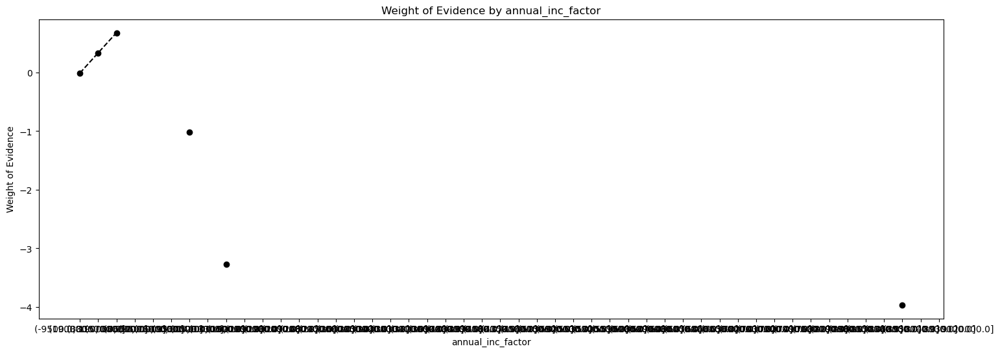

In [486]:
plot_by_woe(df_annual_inc_factor)

In [487]:
#94% of data is in first bin only
#Lets divide in 100 bins

In [488]:
df_inputs_preprocess['annual_inc_factor'] = pd.cut(df_inputs_preprocess['annual_inc'], 100)

In [489]:
df_annual_inc_factor = woe_cont(df_inputs_preprocess, 'annual_inc_factor', df_target_preprocess)
df_annual_inc_factor

,annual_inc_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(-9500.0, 95000.0]",325648,0.02,0.98,0.77,319201.00,6447.00,0.77,0.82,-0.06,NaN,inf
1,"(95000.0, 190000.0]",84045,0.01,0.99,0.20,82787.00,1258.00,0.20,0.16,0.22,0.28,inf
2,"(190000.0, 285000.0]",8186,0.01,0.99,0.02,8073.00,113.00,0.02,0.01,0.31,0.08,inf
3,"(285000.0, 380000.0]",1821,0.01,0.99,0.00,1800.00,21.00,0.00,0.00,0.49,0.18,inf
4,"(380000.0, 475000.0]",652,0.01,0.99,0.00,646.00,6.00,0.00,0.00,0.72,0.23,inf
5,"(475000.0, 570000.0]",291,0.01,0.99,0.00,288.00,3.00,0.00,0.00,0.60,0.11,inf
6,"(570000.0, 665000.0]",165,0.00,1.00,0.00,165.00,0.00,0.00,0.00,inf,inf,inf
7,"(665000.0, 760000.0]",92,0.00,1.00,0.00,92.00,0.00,0.00,0.00,inf,NaN,inf
8,"(760000.0, 855000.0]",46,0.00,1.00,0.00,46.00,0.00,0.00,0.00,inf,NaN,inf
9,"(855000.0, 950000.0]",24,0.00,1.00,0.00,24.00,0.00,0.00,0.00,inf,NaN,inf


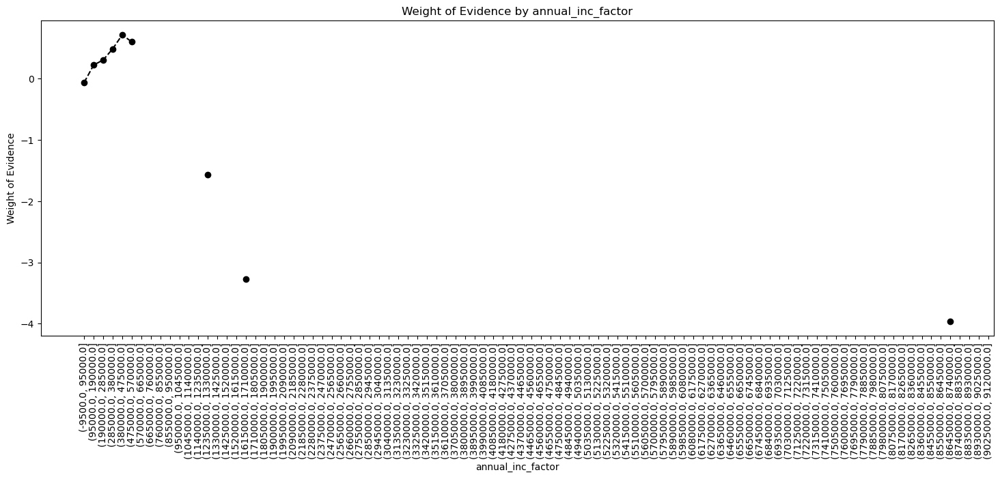

In [490]:
plot_by_woe(df_annual_inc_factor, 90)

In [491]:
df_inputs_preprocess_annual_inc = df_inputs_preprocess.loc[df_inputs_preprocess['annual_inc'] < 140000, : ]

In [492]:
df_inputs_preprocess_annual_inc['annual_inc_factor'] = pd.cut(df_inputs_preprocess_annual_inc['annual_inc'], 50)

In [493]:
df_high_annual_inc_factor = woe_cont(df_inputs_preprocess_annual_inc, 'annual_inc_factor', df_target_preprocess[df_inputs_preprocess_annual_inc.index])
df_high_annual_inc_factor

,annual_inc_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(-139.997, 2799.94]",4,0.00,1.00,0.00,4.00,0.00,0.00,0.00,inf,NaN,inf
1,"(2799.94, 5599.88]",12,0.08,0.92,0.00,11.00,1.00,0.00,0.00,-1.55,inf,inf
2,"(5599.88, 8399.82]",51,0.02,0.98,0.00,50.00,1.00,0.00,0.00,-0.03,1.51,inf
3,"(8399.82, 11199.76]",431,0.03,0.97,0.00,416.00,15.00,0.00,0.00,-0.62,0.59,inf
4,"(11199.76, 13999.7]",715,0.03,0.97,0.00,697.00,18.00,0.00,0.00,-0.29,0.33,inf
5,"(13999.7, 16799.64]",1447,0.03,0.97,0.00,1409.00,38.00,0.00,0.01,-0.33,0.04,inf
6,"(16799.64, 19599.58]",1849,0.03,0.97,0.00,1790.00,59.00,0.00,0.01,-0.53,0.20,inf
7,"(19599.58, 22399.52]",3820,0.03,0.97,0.01,3714.00,106.00,0.01,0.01,-0.39,0.14,inf
8,"(22399.52, 25199.46]",6420,0.03,0.97,0.02,6252.00,168.00,0.02,0.02,-0.33,0.06,inf
9,"(25199.46, 27999.4]",4073,0.02,0.98,0.01,3976.00,97.00,0.01,0.01,-0.23,0.10,inf


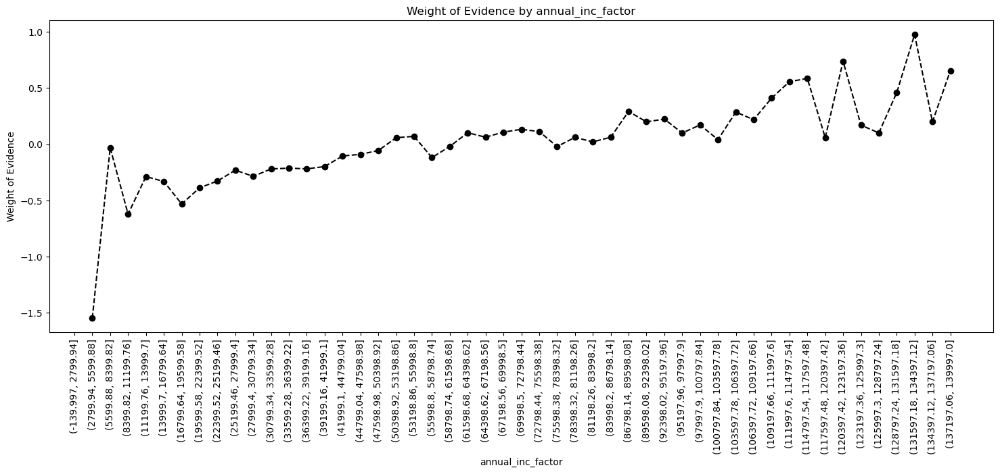

In [494]:
plot_by_woe(df_high_annual_inc_factor, 90)

In [495]:
# WoE is monotonically decreasing with income, so we split income in 10 equal categories, each with width of 15k.
df_inputs_preprocess['annual_inc:<20K'] = np.where((df_inputs_preprocess['annual_inc'] <= 20000), 1, 0)
df_inputs_preprocess['annual_inc:20K-30K'] = np.where((df_inputs_preprocess['annual_inc'] > 20000) & (df_inputs_preprocess['annual_inc'] <= 30000), 1, 0)
df_inputs_preprocess['annual_inc:30K-40K'] = np.where((df_inputs_preprocess['annual_inc'] > 30000) & (df_inputs_preprocess['annual_inc'] <= 40000), 1, 0)
df_inputs_preprocess['annual_inc:40K-50K'] = np.where((df_inputs_preprocess['annual_inc'] > 40000) & (df_inputs_preprocess['annual_inc'] <= 50000), 1, 0)
df_inputs_preprocess['annual_inc:50K-60K'] = np.where((df_inputs_preprocess['annual_inc'] > 50000) & (df_inputs_preprocess['annual_inc'] <= 60000), 1, 0)
df_inputs_preprocess['annual_inc:60K-70K'] = np.where((df_inputs_preprocess['annual_inc'] > 60000) & (df_inputs_preprocess['annual_inc'] <= 70000), 1, 0)
df_inputs_preprocess['annual_inc:70K-80K'] = np.where((df_inputs_preprocess['annual_inc'] > 70000) & (df_inputs_preprocess['annual_inc'] <= 80000), 1, 0)
df_inputs_preprocess['annual_inc:80K-90K'] = np.where((df_inputs_preprocess['annual_inc'] > 80000) & (df_inputs_preprocess['annual_inc'] <= 90000), 1, 0)
df_inputs_preprocess['annual_inc:90K-100K'] = np.where((df_inputs_preprocess['annual_inc'] > 90000) & (df_inputs_preprocess['annual_inc'] <= 100000), 1, 0)
df_inputs_preprocess['annual_inc:100K-120K'] = np.where((df_inputs_preprocess['annual_inc'] > 100000) & (df_inputs_preprocess['annual_inc'] <= 120000), 1, 0)
df_inputs_preprocess['annual_inc:120K-140K'] = np.where((df_inputs_preprocess['annual_inc'] > 120000) & (df_inputs_preprocess['annual_inc'] <= 140000), 1, 0)
df_inputs_preprocess['annual_inc:>140K'] = np.where((df_inputs_preprocess['annual_inc'] > 140000), 1, 0)

In [496]:
#month_since_last_delinq

In [497]:
#Filtering non null values
df_inputs_preprocess_month_since_last_delinq = df_inputs_preprocess[pd.notnull(df_inputs_preprocess['mths_since_last_delinq'])]

In [498]:
df_inputs_preprocess_month_since_last_delinq['mths_since_last_delinq_factor'] = pd.cut(
    df_inputs_preprocess_month_since_last_delinq['mths_since_last_delinq'],50)

In [499]:
df_month_since_last_delinq_factor = woe_cont(df_inputs_preprocess_month_since_last_delinq, 
                                             'mths_since_last_delinq_factor', df_target_preprocess[df_inputs_preprocess_month_since_last_delinq.index])
df_month_since_last_delinq_factor

,mths_since_last_delinq_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(-0.176, 3.52]",7261,0.03,0.97,0.03,7071.00,190.00,0.03,0.05,-0.35,NaN,inf
1,"(3.52, 7.04]",15763,0.02,0.98,0.07,15422.00,341.00,0.07,0.08,-0.15,0.19,inf
2,"(7.04, 10.56]",12365,0.02,0.98,0.06,12122.00,243.00,0.06,0.06,-0.06,0.10,inf
3,"(10.56, 14.08]",16125,0.02,0.98,0.07,15798.00,327.00,0.07,0.08,-0.09,0.03,inf
4,"(14.08, 17.6]",11384,0.02,0.98,0.05,11122.00,262.00,0.05,0.06,-0.22,0.13,inf
5,"(17.6, 21.12]",14291,0.02,0.98,0.07,14057.00,234.00,0.07,0.06,0.13,0.35,inf
6,"(21.12, 24.64]",10544,0.02,0.98,0.05,10356.00,188.00,0.05,0.05,0.04,0.09,inf
7,"(24.64, 28.16]",13761,0.02,0.98,0.06,13510.00,251.00,0.06,0.06,0.02,0.02,inf
8,"(28.16, 31.68]",9867,0.01,0.99,0.05,9719.00,148.00,0.05,0.04,0.22,0.20,inf
9,"(31.68, 35.2]",12583,0.01,0.99,0.06,12397.00,186.00,0.06,0.05,0.23,0.01,inf


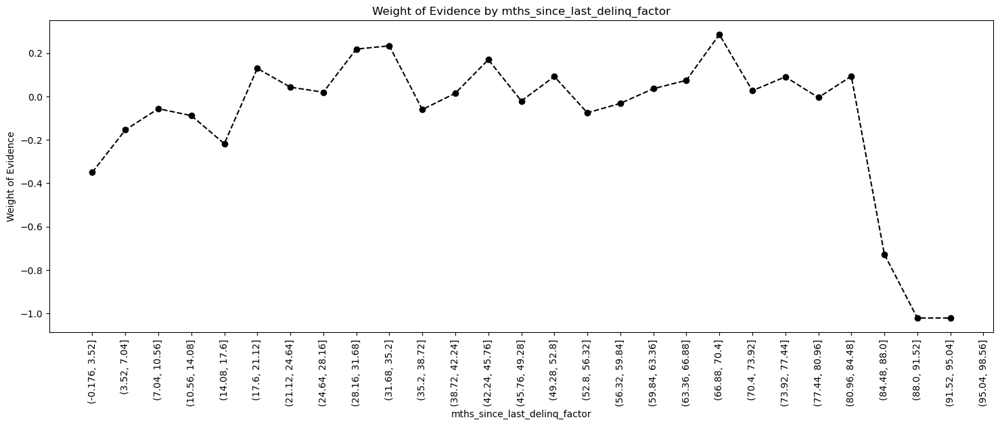

In [500]:
plot_by_woe(df_month_since_last_delinq_factor, 90)

In [501]:
# Categories: Missing, 0-3, 4-30, 31-56, >=57
df_inputs_preprocess['mths_since_last_delinq:Missing'] = np.where((df_inputs_preprocess['mths_since_last_delinq'].isnull()), 1, 0)
df_inputs_preprocess['mths_since_last_delinq:0-3'] = np.where((df_inputs_preprocess['mths_since_last_delinq'] >= 0) & (df_inputs_preprocess['mths_since_last_delinq'] <= 3), 1, 0)
df_inputs_preprocess['mths_since_last_delinq:4-30'] = np.where((df_inputs_preprocess['mths_since_last_delinq'] >= 4) & (df_inputs_preprocess['mths_since_last_delinq'] <= 30), 1, 0)
df_inputs_preprocess['mths_since_last_delinq:31-56'] = np.where((df_inputs_preprocess['mths_since_last_delinq'] >= 31) & (df_inputs_preprocess['mths_since_last_delinq'] <= 56), 1, 0)
df_inputs_preprocess['mths_since_last_delinq:>=57'] = np.where((df_inputs_preprocess['mths_since_last_delinq'] >= 57), 1, 0)

In [502]:
#debt to income

In [503]:
df_inputs_preprocess['dti'].nunique()

4086

In [504]:
df_inputs_preprocess['dti_factor'] = pd.cut(df_inputs_preprocess['dti'], 50)

In [505]:
df_dti_factor = woe_cont(df_inputs_preprocess, 'dti_factor', df_target_preprocess)
df_dti_factor

,dti_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(-9.999, 199.98]",421089,0.02,0.98,1.00,413238.00,7851.00,1.00,1.00,-0.00,NaN,inf
1,"(199.98, 399.96]",1,0.00,1.00,0.00,1.00,0.00,0.00,0.00,inf,inf,inf
2,"(399.96, 599.94]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
3,"(599.94, 799.92]",1,0.00,1.00,0.00,1.00,0.00,0.00,0.00,inf,NaN,inf
4,"(799.92, 999.9]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
5,"(999.9, 1199.88]",1,0.00,1.00,0.00,1.00,0.00,0.00,0.00,inf,NaN,inf
6,"(1199.88, 1399.86]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
7,"(1399.86, 1599.84]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
8,"(1599.84, 1799.82]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf
9,"(1799.82, 1999.8]",0,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,inf


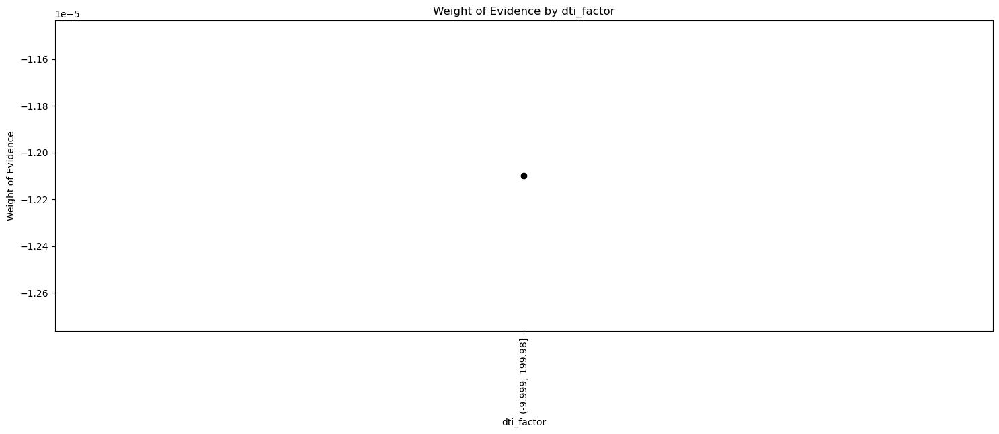

In [506]:
plot_by_woe(df_dti_factor,90)

In [507]:
df_inputs_preprocess['dti:<=1.4'] = np.where((df_inputs_preprocess['dti'] <= 1.4), 1, 0)
df_inputs_preprocess['dti:1.4-3.5'] = np.where((df_inputs_preprocess['dti'] > 1.4) & (df_inputs_preprocess['dti'] <= 3.5), 1, 0)
df_inputs_preprocess['dti:3.5-7.7'] = np.where((df_inputs_preprocess['dti'] > 3.5) & (df_inputs_preprocess['dti'] <= 7.7), 1, 0)
df_inputs_preprocess['dti:7.7-10.5'] = np.where((df_inputs_preprocess['dti'] > 7.7) & (df_inputs_preprocess['dti'] <= 10.5), 1, 0)
df_inputs_preprocess['dti:10.5-16.1'] = np.where((df_inputs_preprocess['dti'] > 10.5) & (df_inputs_preprocess['dti'] <= 16.1), 1, 0)
df_inputs_preprocess['dti:16.1-20.3'] = np.where((df_inputs_preprocess['dti'] > 16.1) & (df_inputs_preprocess['dti'] <= 20.3), 1, 0)
df_inputs_preprocess['dti:20.3-21.7'] = np.where((df_inputs_preprocess['dti'] > 20.3) & (df_inputs_preprocess['dti'] <= 21.7), 1, 0)
df_inputs_preprocess['dti:21.7-22.4'] = np.where((df_inputs_preprocess['dti'] > 21.7) & (df_inputs_preprocess['dti'] <= 22.4), 1, 0)
df_inputs_preprocess['dti:22.4-35'] = np.where((df_inputs_preprocess['dti'] > 22.4) & (df_inputs_preprocess['dti'] <= 35), 1, 0)
df_inputs_preprocess['dti:>35'] = np.where((df_inputs_preprocess['dti'] > 35), 1, 0)

In [508]:
#mths_since_last_record
# We have to create one category for missing values and do fine and coarse classing for the rest.

In [509]:
df_inputs_preprocess['mths_since_last_record'].nunique()

121

In [510]:
df_inputs_preprocess['mths_since_last_record_factor'] = pd.cut(df_inputs_preprocess['mths_since_last_record'], 50)

In [511]:
mths_since_last_record_factor = woe_cont(df_inputs_preprocess, 'mths_since_last_record_factor', df_target_preprocess[df_inputs_preprocess.index])
mths_since_last_record_factor

,mths_since_last_record_factor,n_obs,prop_bad,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_WoE,IV
0,"(-0.12, 2.4]",87,0.03,0.97,0.00,84.00,3.00,0.00,0.00,-0.57,NaN,0.06
1,"(2.4, 4.8]",161,0.03,0.97,0.00,156.00,5.00,0.00,0.00,-0.46,0.11,0.06
2,"(4.8, 7.2]",344,0.02,0.98,0.00,336.00,8.00,0.00,0.01,-0.17,0.30,0.06
3,"(7.2, 9.6]",291,0.02,0.98,0.00,286.00,5.00,0.00,0.00,0.14,0.31,0.06
4,"(9.6, 12.0]",537,0.03,0.97,0.01,521.00,16.00,0.01,0.01,-0.42,0.56,0.06
5,"(12.0, 14.4]",404,0.01,0.99,0.01,398.00,6.00,0.01,0.00,0.29,0.71,0.06
6,"(14.4, 16.8]",410,0.02,0.98,0.01,402.00,8.00,0.01,0.01,0.01,0.28,0.06
7,"(16.8, 19.2]",693,0.01,0.99,0.01,684.00,9.00,0.01,0.01,0.43,0.41,0.06
8,"(19.2, 21.6]",521,0.01,0.99,0.01,514.00,7.00,0.01,0.00,0.39,0.03,0.06
9,"(21.6, 24.0]",825,0.02,0.98,0.01,808.00,17.00,0.01,0.01,-0.04,0.43,0.06


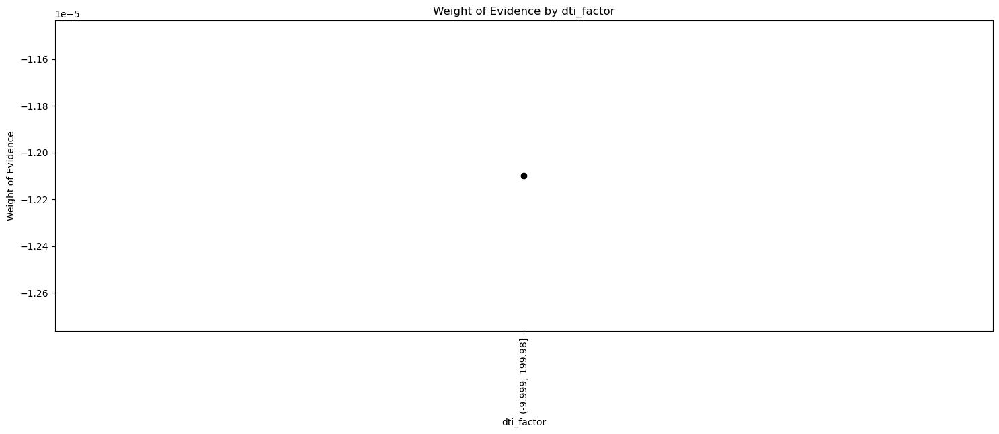

In [512]:
plot_by_woe(df_dti_factor,90)

In [513]:
# Categories: 'Missing', '0-2', '3-20', '21-31', '32-80', '81-86', '>86'
df_inputs_preprocess['mths_since_last_record:Missing'] = np.where((df_inputs_preprocess['mths_since_last_record'].isnull()), 1, 0)
df_inputs_preprocess['mths_since_last_record:0-2'] = np.where((df_inputs_preprocess['mths_since_last_record'] >= 0) & (df_inputs_preprocess['mths_since_last_record'] <= 2), 1, 0)
df_inputs_preprocess['mths_since_last_record:3-20'] = np.where((df_inputs_preprocess['mths_since_last_record'] >= 3) & (df_inputs_preprocess['mths_since_last_record'] <= 20), 1, 0)
df_inputs_preprocess['mths_since_last_record:21-31'] = np.where((df_inputs_preprocess['mths_since_last_record'] >= 21) & (df_inputs_preprocess['mths_since_last_record'] <= 31), 1, 0)
df_inputs_preprocess['mths_since_last_record:32-80'] = np.where((df_inputs_preprocess['mths_since_last_record'] >= 32) & (df_inputs_preprocess['mths_since_last_record'] <= 80), 1, 0)
df_inputs_preprocess['mths_since_last_record:81-86'] = np.where((df_inputs_preprocess['mths_since_last_record'] >= 81) & (df_inputs_preprocess['mths_since_last_record'] <= 86), 1, 0)
df_inputs_preprocess['mths_since_last_record:>86'] = np.where((df_inputs_preprocess['mths_since_last_record'] > 86), 1, 0)

In [514]:
df_loan_inputs_new = df_inputs_preprocess

In [515]:
df_loan_targets_new = df_target_preprocess

In [516]:
df_loan_inputs_new.shape, df_loan_targets_new.shape

((421094, 311), (421094,))

In [517]:
df_loan_inputs_new.to_csv('df_loan_inputs_new.csv')
df_loan_targets_new.to_csv('df_loan_targets_new.csv')

## ----------------------------------------Preprocessing over----------------------------------------------

In [518]:
inputs_train_with_ref_cat = pd.read_csv('inputs_train_with_ref_cat.csv', index_col = 0)

In [519]:
inputs_new_with_ref_cat = df_loan_inputs_new.loc[:,[
'grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:Rent_Other_None_Any',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:NY',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:CA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:TX',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'initial_list_status:f',
'initial_list_status:w',
'term:36',
'term:60',
'emp_length_int:0',
'emp_length_int:1',
'emp_length_int:2-4',
'emp_length_int:5-6',
'emp_length_int:7-9',
'emp_length_int:10',
'mths_since_issue_d:<38',
'mths_since_issue_d:38-39',
'mths_since_issue_d:40-41',
'mths_since_issue_d:42-48',
'mths_since_issue_d:49-52',
'mths_since_issue_d:53-64',
'mths_since_issue_d:65-84',
'mths_since_issue_d:>84',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',
'month_since_earliest_cr_line:<140',
'month_since_earliest_cr_line:141-164',
'month_since_earliest_cr_line:165-247',
'month_since_earliest_cr_line:248-270',
'month_since_earliest_cr_line:271-352',
'month_since_earliest_cr_line:>352',
'inq_last_6mths:0',
'inq_last_6mths:1-2',
'inq_last_6mths:3-6',
'inq_last_6mths:>6',
'total_acc:<=27',
'total_acc:28-51',
'total_acc:>=52',
'annual_inc:<20K',
'annual_inc:20K-30K',
'annual_inc:30K-40K',
'annual_inc:40K-50K',
'annual_inc:50K-60K',
'annual_inc:60K-70K',
'annual_inc:70K-80K',
'annual_inc:80K-90K',
'annual_inc:90K-100K',
'annual_inc:100K-120K',
'annual_inc:120K-140K',
'annual_inc:>140K',
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>86'
]]

In [520]:
inputs_train_with_ref_cat.shape, inputs_new_with_ref_cat.shape

((373028, 92), (421094, 92))

In [521]:
#If distribution has changed in new/application data from old data on which model has been developed, 
#we have sufficient evidence then to rework on model

In [522]:
df_scorecard = pd.read_csv('df_scorecard.csv', index_col = 0)
df_scorecard

,index,Feature name,Coefficients,p_values,is_significant_5,is_significant_10,Original_independent_variable,Score calculation,Credit Score
0,0,Intercept,1.16,NaN,No,No,Intercept,320.23,320.00
1,1,grade:A,-1.16,0.00,Yes,Yes,grade,94.44,94.00
2,2,grade:B,-0.91,0.00,Yes,Yes,grade,73.97,74.00
3,3,grade:C,-0.71,0.00,Yes,Yes,grade,57.90,58.00
4,4,grade:D,-0.52,0.00,Yes,Yes,grade,42.25,42.00
5,5,grade:E,-0.34,0.00,Yes,Yes,grade,27.62,28.00
6,6,grade:F,-0.15,0.00,Yes,Yes,grade,12.17,12.00
7,7,home_ownership:OWN,-0.09,0.00,Yes,Yes,home_ownership,7.43,7.00
8,8,home_ownership:MORTGAGE,-0.11,0.00,Yes,Yes,home_ownership,8.71,9.00
9,9,addr_state:NM_VA,-0.03,0.30,No,No,addr_state,2.71,3.00


In [523]:
inputs_train_with_ref_w_intercept = inputs_train_with_ref_cat
inputs_train_with_ref_w_intercept.insert(0, 'Intercept', 1)
inputs_train_with_ref_w_intercept = inputs_train_with_ref_w_intercept[df_scorecard['Feature name'].values]

In [524]:
inputs_train_with_ref_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:w,term:36,emp_length_int:1,emp_length_int:2-4,emp_length_int:5-6,emp_length_int:7-9,emp_length_int:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,month_since_earliest_cr_line:141-164,month_since_earliest_cr_line:165-247,month_since_earliest_cr_line:248-270,month_since_earliest_cr_line:271-352,month_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,total_acc:28-51,total_acc:>=52,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>86,grade:G,home_ownership:Rent_Other_None_Any,addr_state:ND_NE_IA_NV_FL_HI_AL,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,initial_list_status:f,term:60,emp_length_int:0,mths_since_issue_d:>84,int_rate:>20.281,month_since_earliest_cr_line:<140,inq_last_6mths:>6,total_acc:<=27,annual_inc:<20K,mths_since_last_delinq:0-3,mths_since_last_record:0-2
427211,1,True,False,False,False,False,False,False,True,0,False,0,False,0,0,0,0,0,False,0,1,0,False,True,False,True,0,0,False,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,False,False,0,False,0,True,0,0,0,0,0,0,0,0,0,0
206088,1,False,False,True,False,False,False,False,True,0,False,0,False,1,0,0,0,0,False,0,0,0,True,False,False,True,0,0,False,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,False,False,0,False,0,True,0,0,0,0,0,0,0,0,0,0
136020,1,True,False,False,False,False,False,False,True,0,False,0,False,0,0,0,1,0,False,0,0,0,False,False,False,True,0,0,False,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,False,False,0,True,0,True,0,0,0,0,0,0,1,0,0,0
412305,1,False,False,False,True,False,False,False,False,0,False,0,False,0,0,1,0,0,False,0,0,0,False,True,False,True,0,0,False,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,False,True,0,False,0,True,0,0,0,0,0,0,1,0,0,0
36159,1,False,False,True,False,False,False,False,True,0,False,0,True,0,0,0,0,0,False,0,0,0,False,False,False,False,0,0,False,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,False,False,0,True,1,True,0,0,1,0,0,0,0,0,0,0


In [525]:
inputs_new_with_ref_w_intercept = inputs_new_with_ref_cat
inputs_new_with_ref_w_intercept.insert(0, 'Intercept', 1)
inputs_new_with_ref_w_intercept = inputs_new_with_ref_w_intercept[df_scorecard['Feature name'].values]
inputs_new_with_ref_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:w,term:36,emp_length_int:1,emp_length_int:2-4,emp_length_int:5-6,emp_length_int:7-9,emp_length_int:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,month_since_earliest_cr_line:141-164,month_since_earliest_cr_line:165-247,month_since_earliest_cr_line:248-270,month_since_earliest_cr_line:271-352,month_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,total_acc:28-51,total_acc:>=52,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>86,grade:G,home_ownership:Rent_Other_None_Any,addr_state:ND_NE_IA_NV_FL_HI_AL,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,initial_list_status:f,term:60,emp_length_int:0,mths_since_issue_d:>84,int_rate:>20.281,month_since_earliest_cr_line:<140,inq_last_6mths:>6,total_acc:<=27,annual_inc:<20K,mths_since_last_delinq:0-3,mths_since_last_record:0-2
0,1,False,False,True,False,False,False,False,True,0,False,0,False,0,0,0,0,0,False,0,0,1,False,True,False,False,0,1,True,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,False,False,0,False,0,False,1,0,0,0,0,0,0,0,0,0
1,1,True,False,False,False,False,False,False,True,0,False,0,False,0,0,1,0,0,False,0,0,0,True,False,True,False,0,0,True,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,False,False,0,False,0,False,0,1,0,0,0,0,1,0,0,0
2,1,False,False,True,False,False,False,False,False,0,False,0,False,0,0,0,0,0,False,0,1,0,False,True,False,True,0,0,True,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,False,True,0,False,0,False,0,0,0,0,1,0,1,0,0,0
3,1,False,False,True,False,False,False,False,False,0,False,0,False,0,0,1,0,0,False,0,0,0,True,False,False,True,0,0,True,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,False,True,0,False,0,False,1,0,0,0,0,0,1,0,0,0
4,1,False,True,False,False,False,False,False,True,0,False,0,False,0,0,0,0,0,False,1,0,0,True,False,False,False,0,1,True,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,False,False,0,False,0,False,1,0,0,0,0,0,1,0,0,0


In [526]:
scorecard_scores = df_scorecard['Credit Score']
scorecard_scores = scorecard_scores.values.reshape(93, 1)

In [527]:
#Scores from original/old data
y_scores_train = inputs_train_with_ref_w_intercept.dot(scorecard_scores)
y_scores_train.head()

,0
427211,704.00
206088,587.00
136020,678.00
412305,520.00
36159,542.00


In [528]:
#Scores from new data
y_scores_new = inputs_new_with_ref_w_intercept.dot(scorecard_scores)
y_scores_new.head()

,0
0,743.00
1,758.00
2,633.00
3,638.00
4,708.00


In [529]:
inputs_train_with_ref_w_intercept = pd.concat([inputs_train_with_ref_w_intercept, y_scores_train], axis = 1)
inputs_new_with_ref_w_intercept = pd.concat([inputs_new_with_ref_w_intercept, y_scores_new], axis = 1)

In [530]:
inputs_train_with_ref_w_intercept.columns.values[inputs_train_with_ref_w_intercept.shape[1] - 1] = 'Score'
inputs_new_with_ref_w_intercept.columns.values[inputs_new_with_ref_w_intercept.shape[1] - 1] = 'Score'

In [531]:
inputs_train_with_ref_w_intercept.head(2)

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:w,term:36,emp_length_int:1,emp_length_int:2-4,emp_length_int:5-6,emp_length_int:7-9,emp_length_int:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,month_since_earliest_cr_line:141-164,month_since_earliest_cr_line:165-247,month_since_earliest_cr_line:248-270,month_since_earliest_cr_line:271-352,month_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,total_acc:28-51,total_acc:>=52,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>86,grade:G,home_ownership:Rent_Other_None_Any,addr_state:ND_NE_IA_NV_FL_HI_AL,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,initial_list_status:f,term:60,emp_length_int:0,mths_since_issue_d:>84,int_rate:>20.281,month_since_earliest_cr_line:<140,inq_last_6mths:>6,total_acc:<=27,annual_inc:<20K,mths_since_last_delinq:0-3,mths_since_last_record:0-2,Score
427211,1,True,False,False,False,False,False,False,True,0,False,0,False,0,0,0,0,0,False,0,1,0,False,True,False,True,0,0,False,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,False,False,0,False,0,True,0,0,0,0,0,0,0,0,0,0,704.00
206088,1,False,False,True,False,False,False,False,True,0,False,0,False,1,0,0,0,0,False,0,0,0,True,False,False,True,0,0,False,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,False,False,0,False,0,True,0,0,0,0,0,0,0,0,0,0,587.00


In [532]:
inputs_new_with_ref_w_intercept.head(2)

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:w,term:36,emp_length_int:1,emp_length_int:2-4,emp_length_int:5-6,emp_length_int:7-9,emp_length_int:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,month_since_earliest_cr_line:141-164,month_since_earliest_cr_line:165-247,month_since_earliest_cr_line:248-270,month_since_earliest_cr_line:271-352,month_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,total_acc:28-51,total_acc:>=52,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>86,grade:G,home_ownership:Rent_Other_None_Any,addr_state:ND_NE_IA_NV_FL_HI_AL,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,initial_list_status:f,term:60,emp_length_int:0,mths_since_issue_d:>84,int_rate:>20.281,month_since_earliest_cr_line:<140,inq_last_6mths:>6,total_acc:<=27,annual_inc:<20K,mths_since_last_delinq:0-3,mths_since_last_record:0-2,Score
0,1,False,False,True,False,False,False,False,True,0,False,0,False,0,0,0,0,0,False,0,0,1,False,True,False,False,0,1,True,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,False,False,0,False,0,False,1,0,0,0,0,0,0,0,0,0,743.00
1,1,True,False,False,False,False,False,False,True,0,False,0,False,0,0,1,0,0,False,0,0,0,True,False,True,False,0,0,True,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,False,False,0,False,0,False,0,1,0,0,0,0,1,0,0,0,758.00


In [533]:
#We need to convert score to dummy variables as we calculate PSI using dummy variable

In [534]:
inputs_train_with_ref_w_intercept['Score:300-350'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 300) & (inputs_train_with_ref_w_intercept['Score'] < 350), 1, 0)
inputs_train_with_ref_w_intercept['Score:350-400'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 350) & (inputs_train_with_ref_w_intercept['Score'] < 400), 1, 0)
inputs_train_with_ref_w_intercept['Score:400-450'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 400) & (inputs_train_with_ref_w_intercept['Score'] < 450), 1, 0)
inputs_train_with_ref_w_intercept['Score:450-500'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 450) & (inputs_train_with_ref_w_intercept['Score'] < 500), 1, 0)
inputs_train_with_ref_w_intercept['Score:500-550'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 500) & (inputs_train_with_ref_w_intercept['Score'] < 550), 1, 0)
inputs_train_with_ref_w_intercept['Score:550-600'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 550) & (inputs_train_with_ref_w_intercept['Score'] < 600), 1, 0)
inputs_train_with_ref_w_intercept['Score:600-650'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 600) & (inputs_train_with_ref_w_intercept['Score'] < 650), 1, 0)
inputs_train_with_ref_w_intercept['Score:650-700'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 650) & (inputs_train_with_ref_w_intercept['Score'] < 700), 1, 0)
inputs_train_with_ref_w_intercept['Score:700-750'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 700) & (inputs_train_with_ref_w_intercept['Score'] < 750), 1, 0)
inputs_train_with_ref_w_intercept['Score:750-800'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 750) & (inputs_train_with_ref_w_intercept['Score'] < 800), 1, 0)
inputs_train_with_ref_w_intercept['Score:800-850'] = np.where((inputs_train_with_ref_w_intercept['Score'] >= 800) & (inputs_train_with_ref_w_intercept['Score'] <= 850), 1, 0)

In [535]:
inputs_new_with_ref_w_intercept['Score:300-350'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 300) & (inputs_new_with_ref_w_intercept['Score'] < 350), 1, 0)
inputs_new_with_ref_w_intercept['Score:350-400'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 350) & (inputs_new_with_ref_w_intercept['Score'] < 400), 1, 0)
inputs_new_with_ref_w_intercept['Score:400-450'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 400) & (inputs_new_with_ref_w_intercept['Score'] < 450), 1, 0)
inputs_new_with_ref_w_intercept['Score:450-500'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 450) & (inputs_new_with_ref_w_intercept['Score'] < 500), 1, 0)
inputs_new_with_ref_w_intercept['Score:500-550'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 500) & (inputs_new_with_ref_w_intercept['Score'] < 550), 1, 0)
inputs_new_with_ref_w_intercept['Score:550-600'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 550) & (inputs_new_with_ref_w_intercept['Score'] < 600), 1, 0)
inputs_new_with_ref_w_intercept['Score:600-650'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 600) & (inputs_new_with_ref_w_intercept['Score'] < 650), 1, 0)
inputs_new_with_ref_w_intercept['Score:650-700'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 650) & (inputs_new_with_ref_w_intercept['Score'] < 700), 1, 0)
inputs_new_with_ref_w_intercept['Score:700-750'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 700) & (inputs_new_with_ref_w_intercept['Score'] < 750), 1, 0)
inputs_new_with_ref_w_intercept['Score:750-800'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 750) & (inputs_new_with_ref_w_intercept['Score'] < 800), 1, 0)
inputs_new_with_ref_w_intercept['Score:800-850'] = np.where((inputs_new_with_ref_w_intercept['Score'] >= 800) & (inputs_new_with_ref_w_intercept['Score'] <= 850), 1, 0)

### PSI Calculation

In [536]:
PSI_calc_train = inputs_train_with_ref_w_intercept.sum() / inputs_train_with_ref_w_intercept.shape[0]

In [537]:
PSI_calc_new = inputs_new_with_ref_w_intercept.sum() / inputs_new_with_ref_w_intercept.shape[0]

In [538]:
PSI_calc_train

Intercept                                        1.00
grade:A                                          0.16
grade:B                                          0.29
grade:C                                          0.27
grade:D                                          0.16
grade:E                                          0.08
grade:F                                          0.03
home_ownership:OWN                               0.09
home_ownership:MORTGAGE                          0.51
addr_state:NM_VA                                 0.04
addr_state:NY                                    0.09
addr_state:OK_TN_MO_LA_MD_NC                     0.10
addr_state:CA                                    0.15
addr_state:UT_KY_AZ_NJ                           0.08
addr_state:AR_MI_PA_OH_MN                        0.12
addr_state:RI_MA_DE_SD_IN                        0.05
addr_state:GA_WA_OR                              0.07
addr_state:WI_MT                                 0.02
addr_state:TX               

In [539]:
PSI_calc_new

Intercept                                        1.00
grade:A                                          0.17
grade:B                                          0.28
grade:C                                          0.29
grade:D                                          0.15
grade:E                                          0.08
grade:F                                          0.02
home_ownership:OWN                               0.11
home_ownership:MORTGAGE                          0.49
addr_state:NM_VA                                 0.03
addr_state:NY                                    0.08
addr_state:OK_TN_MO_LA_MD_NC                     0.11
addr_state:CA                                    0.14
addr_state:UT_KY_AZ_NJ                           0.08
addr_state:AR_MI_PA_OH_MN                        0.12
addr_state:RI_MA_DE_SD_IN                        0.05
addr_state:GA_WA_OR                              0.07
addr_state:WI_MT                                 0.02
addr_state:TX               

In [540]:
PSI_calc = pd.concat([PSI_calc_train,PSI_calc_new], axis = 1)

In [541]:
PSI_calc = PSI_calc.reset_index()

In [542]:
PSI_calc = pd.DataFrame(PSI_calc)

In [543]:
PSI_calc

,index,0,1
0,Intercept,1.00,1.00
1,grade:A,0.16,0.17
2,grade:B,0.29,0.28
3,grade:C,0.27,0.29
4,grade:D,0.16,0.15
5,grade:E,0.08,0.08
6,grade:F,0.03,0.02
7,home_ownership:OWN,0.09,0.11
8,home_ownership:MORTGAGE,0.51,0.49
9,addr_state:NM_VA,0.04,0.03


In [544]:
PSI_calc = PSI_calc.rename(columns={
    'index': 'original variable name',
    0: 'old population',
    1: 'new population'
})

In [545]:
PSI_calc

,original variable name,old population,new population
0,Intercept,1.00,1.00
1,grade:A,0.16,0.17
2,grade:B,0.29,0.28
3,grade:C,0.27,0.29
4,grade:D,0.16,0.15
5,grade:E,0.08,0.08
6,grade:F,0.03,0.02
7,home_ownership:OWN,0.09,0.11
8,home_ownership:MORTGAGE,0.51,0.49
9,addr_state:NM_VA,0.04,0.03


In [546]:
PSI_calc['variable name'] = PSI_calc['original variable name'].str.split(':').str[0]

In [547]:
PSI_calc.columns = ['Dummies', 'old population', 'new population', 'independent variable']

In [548]:
PSI_calc = PSI_calc[np.array(['Dummies', 'independent variable', 'old population', 'new population'])]

In [549]:
PSI_calc

,Dummies,independent variable,old population,new population
0,Intercept,Intercept,1.00,1.00
1,grade:A,grade,0.16,0.17
2,grade:B,grade,0.29,0.28
3,grade:C,grade,0.27,0.29
4,grade:D,grade,0.16,0.15
5,grade:E,grade,0.08,0.08
6,grade:F,grade,0.03,0.02
7,home_ownership:OWN,home_ownership,0.09,0.11
8,home_ownership:MORTGAGE,home_ownership,0.51,0.49
9,addr_state:NM_VA,addr_state,0.04,0.03


In [550]:
#We do not need score and intercept for PSI calculation

In [551]:
PSI_calc = PSI_calc[(PSI_calc['Dummies'] != 'Intercept') & (PSI_calc['Dummies'] != 'Score')]

In [552]:
PSI_calc

,Dummies,independent variable,old population,new population
1,grade:A,grade,0.16,0.17
2,grade:B,grade,0.29,0.28
3,grade:C,grade,0.27,0.29
4,grade:D,grade,0.16,0.15
5,grade:E,grade,0.08,0.08
6,grade:F,grade,0.03,0.02
7,home_ownership:OWN,home_ownership,0.09,0.11
8,home_ownership:MORTGAGE,home_ownership,0.51,0.49
9,addr_state:NM_VA,addr_state,0.04,0.03
10,addr_state:NY,addr_state,0.09,0.08


In [553]:
PSI_calc.dtypes

Dummies                 object
independent variable    object
old population          object
new population          object
dtype: object

In [554]:
PSI_calc['Contribution'] = np.where((PSI_calc['old population'] == 0) | (PSI_calc['new population'] == 0), 0,
                                   (PSI_calc['new population'] - PSI_calc['old population']) * np.log(pd.to_numeric(PSI_calc['new population'])/pd.to_numeric(PSI_calc['old population'])))

In [555]:
PSI_calc

,Dummies,independent variable,old population,new population,Contribution
1,grade:A,grade,0.16,0.17,0.00
2,grade:B,grade,0.29,0.28,0.00
3,grade:C,grade,0.27,0.29,0.00
4,grade:D,grade,0.16,0.15,0.00
5,grade:E,grade,0.08,0.08,0.00
6,grade:F,grade,0.03,0.02,0.00
7,home_ownership:OWN,home_ownership,0.09,0.11,0.00
8,home_ownership:MORTGAGE,home_ownership,0.51,0.49,0.00
9,addr_state:NM_VA,addr_state,0.04,0.03,0.00
10,addr_state:NY,addr_state,0.09,0.08,0.00


In [556]:
PSI_calc.groupby('independent variable')['Contribution'].sum()

independent variable
Score                          1.05
addr_state                     0.00
annual_inc                     0.01
emp_length_int                 0.01
grade                          0.01
home_ownership                 0.00
initial_list_status            0.33
inq_last_6mths                 0.05
int_rate                       0.08
month_since_earliest_cr_line   0.03
mths_since_issue_d             2.39
mths_since_last_delinq         0.01
mths_since_last_record         0.06
purpose                        0.01
term                           0.01
total_acc                      0.00
verification_status            0.05
Name: Contribution, dtype: object

In [557]:
#two variables require invetigation: initial_list_status - 0.33; mths_since_issue_d - 2.39